# Whelks and lobsters -- context operator

In [4]:
import sys

sys.path.insert(0, "/home/twright/Documents/PhD/Notebooks")

## The system

In [5]:
R.<x,y> = QQ[]

In [6]:
from ulbc import *

In [7]:
us = [x,y]
k=RIF(0.8); b=RIF(0.6); c=RIF(0.3); e=RIF(0.05); f=RIF(2)
vf = vector([b*x*(RIF(1)-x) - c*x*(k-x)*y,
            -e*y*(RIF(1)+y)+f*x*(k-x)*y])
v0 = [RIF(0.5), RIF(2.0)]
v1 = [RIF(0.4), RIF(2.5)]
v2 = [RIF(1,1.2), RIF(4,6)]

In [8]:
v3 = v2 # [RIF(1,1.1), RIF(4,5)]

In [9]:
Poly(y).var_names

['x', 'y']

In [10]:
Poly(x)

var_names = [b'local_t', b'x', b'y']
res = b'(([1.0000000000 , 1.0000000000] * x))'


(([1.0000000000 , 1.0000000000] * x))

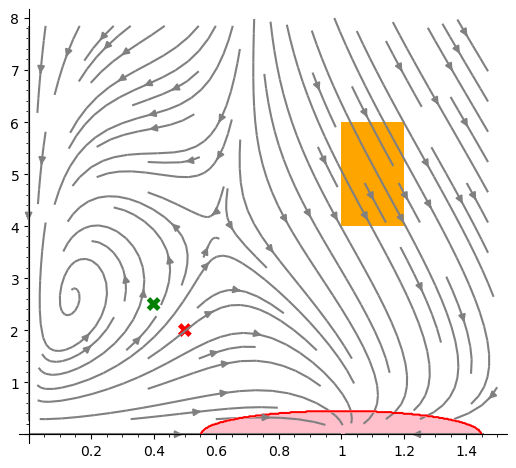

In [11]:
p = streamline_plot(tuple(vf),(x,0,1.5),(y,0,8), color='grey')\
    + point(v0, size=100, marker='X', color='red')\
    + point(v1, size=100, marker='X', color='green')\
    + polygon([(v3[0].lower(), v3[1].lower()),
               (v3[0].lower(), v3[1].upper()),
               (v3[0].upper(), v3[1].upper()),
               (v3[0].upper(), v3[1].lower())],
              color='orange')\
    + region_plot((lambda x, y: (x - 1)^2 + y^2 - 0.2 < 0),
                  (x, 0, 1.5),
                  (y, 0, 8),
                  incol='pink', plot_points=500, bordercol='red')
p.set_aspect_ratio(1/6)
p.show()

## Simple signal

In [14]:
P = Atomic((x - 1)^2 + y^2 - 0.2)

Precomposing Contexts: 1 items in 0.00 seconds
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
integrationScheme = 2
Running Flow*: 1 items in 0.51 seconds
Computed 116 flowpipes in 0.5065287820002595 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d2c3a010>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2010000000000006], [[0.10000000000000000 .. 5.2010000000000006]]))
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)

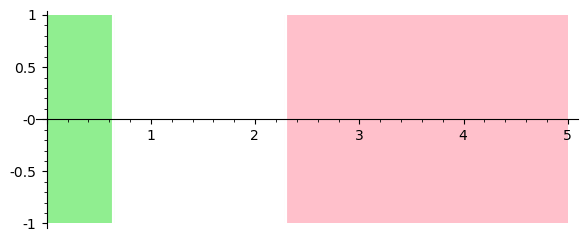

In [15]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
integrationScheme = 2
Computed 116 flowpipes in 2.86102294921875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d2dccae0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.1737138800607713 .. 1.9965111094081805]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.1737138800607713 .. 1.9965111094081805]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.1737138800607713 .. 1.9965111094081805]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

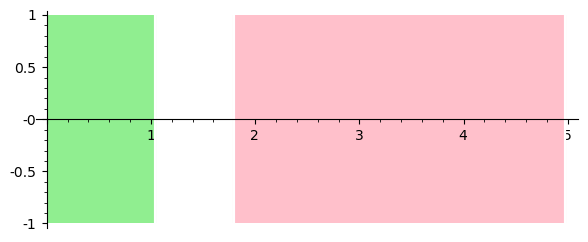

In [16]:
csig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=False,
)
sig = csig.refined_signal(2)
sig.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[2.1617366349087214 .. 2.2470496052623688]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1617366349087214 .. 2.2470496052623688]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1617366349087214 .. 2.2470496052623688]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[2.1246449912991303 .. 2.2125423121039694]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1246449912991303 .. 2.2125423121039694]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1246449912991303 .. 2.2125423121039694]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[2.1061860005277295 .. 2.1822630876654868]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1061860005277295 .. 2.1822630876654868]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1061860005277295 .. 2.1822630876654868]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[2.0171746252510933 .. 2.0893232533525064]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0171746252510933 .. 2.0893232533525064]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.00000

roots = [[1.9935566897724870 .. 2.0630741144280363]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9935566897724870 .. 2.0630741144280363]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9935566897724870 .. 2.0630741144280363]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.9270478411487534 .. 2.0683071276702974]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9270478411487534 .. 2.0683071276702974]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9270478411487534 .. 2.0683071276702974]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.9162476661972414 .. 1.9934778197426049]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9162476661972414 .. 1.9934778197426049]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9162476661972414 .. 1.9934778197426049]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.8584705101312521 .. 1.9200892387573310]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8584705101312521 .. 1.9200892387573310]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8584705101312521 .. 1.9200892387573310]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.9042673950530237 .. 2.0335619976253226]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9042673950530237 .. 2.0335619976253226]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9042673950530237 .. 2.0335619976253226]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.8912565134760315 .. 1.9528375684381188]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8912565134760315 .. 1.9528375684381188]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8912565134760315 .. 1.9528375684381188]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.8663347554745721 .. 1.9297312594163194]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8663347554745721 .. 1.9297312594163194]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8663347554745721 .. 1.9297312594163194]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[2.1137117526383435 .. 2.2042551916511699]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1137117526383435 .. 2.2042551916511699]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1137117526383435 .. 2.2042551916511699]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[2.0830300312970249 .. 2.1765640379868910]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0830300312970249 .. 2.1765640379868910]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0830300312970249 .. 2.1765640379868910]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[2.0165442251710774 .. 2.0965048364187525]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0165442251710774 .. 2.0965048364187525]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0165442251710774 .. 2.0965048364187525]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.9843062798605415 .. 2.0717356909551033]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9843062798605415 .. 2.0717356909551033]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9843062798605415 .. 2.0717356909551033]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[2.0460958578275496 .. 2.1580260714307534]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0460958578275496 .. 2.1580260714307534]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0460958578275496 .. 2.1580260714307534]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.9264157421798411 .. 2.0148640121541704]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9264157421798411 .. 2.0148640121541704]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9264157421798411 .. 2.0148640121541704]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.8723270360371455 .. 2.0050332504956697]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8723270360371455 .. 2.0050332504956697]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8723270360371455 .. 2.0050332504956697]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.7991125717841247 .. 1.8609778804215745]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7991125717841247 .. 1.8609778804215745]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7991125717841247 .. 1.8609778804215745]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.8364538325432893 .. 1.9216486937157243]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8364538325432893 .. 1.9216486937157243]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8364538325432893 .. 1.9216486937157243]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.7516731252802077 .. 1.8905490723140653]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7516731252802077 .. 1.8905490723140653]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7516731252802077 .. 1.8905490723140653]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.7570503947894897 .. 1.8309787678486591]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7570503947894897 .. 1.8309787678486591]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7570503947894897 .. 1.8309787678486591]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.7700753105998239 .. 1.8531311755847538]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7700753105998239 .. 1.8531311755847538]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7700753105998239 .. 1.8531311755847538]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.6701944532859918 .. 1.6724545232073250], [1.6734454325219825 .. 1.8044592207483446]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6701944532859918 .. 1.6724545232073250], 
 [1.6734454325219825 .. 1.8044592207483446]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6701944532859918 .. 1.6724545232073250], 
 [1.6734454325219825 .. 1.8044592207483446]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199999999

roots = [[1.8084842881265057 .. 1.8738210066847123]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8084842881265057 .. 1.8738210066847123]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8084842881265057 .. 1.8738210066847123]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.7407600486342205 .. 1.8182022460206009]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7407600486342205 .. 1.8182022460206009]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7407600486342205 .. 1.8182022460206009]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.6241476052569852 .. 1.8309787678486591]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6241476052569852 .. 1.8309787678486591]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6241476052569852 .. 1.8309787678486591]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.4546080062623170 .. 1.4598704913626573], [1.4662784246453168 .. 1.8465637337197823]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4546080062623170 .. 1.4598704913626573], 
 [1.4662784246453168 .. 1.8465637337197823]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4546080062623170 .. 1.4598704913626573], 
 [1.4662784246453168 .. 1.8465637337197823]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199999999

roots = [[1.6216297909512753 .. 1.7738988159568514]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6216297909512753 .. 1.7738988159568514]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6216297909512753 .. 1.7738988159568514]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

roots = [[1.6078307434423810 .. 1.7441849506468428]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6078307434423810 .. 1.7441849506468428]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6078307434423810 .. 1.7441849506468428]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.4514556900708341 .. 1.7066118696070954]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4514556900708341 .. 1.7066118696070954]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4514556900708341 .. 1.7066118696070954]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.6952111016196844 .. 1.8412943226024110]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6952111016196844 .. 1.8412943226024110]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6952111016196844 .. 1.8412943226024110]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.6076653483962513 .. 1.8240920888260009]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6076653483962513 .. 1.8240920888260009]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6076653483962513 .. 1.8240920888260009]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.6644006943099891 .. 1.7714230039828800]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6644006943099891 .. 1.7714230039828800]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6644006943099891 .. 1.7714230039828800]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.6897316068253527 .. 1.7855153397905648]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6897316068253527 .. 1.7855153397905648]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6897316068253527 .. 1.7855153397905648]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.5388520991762166 .. 1.5408504039251008], [1.5514435413943470 .. 1.8115666551538705]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5388520991762166 .. 1.5408504039251008], 
 [1.5514435413943470 .. 1.8115666551538705]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5388520991762166 .. 1.5408504039251008], 
 [1.5514435413943470 .. 1.8115666551538705]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199999999

roots = [[1.6347710446700820 .. 1.7564739865989272]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6347710446700820 .. 1.7564739865989272]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6347710446700820 .. 1.7564739865989272]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.5841136810343630 .. 1.5875102583063184], [1.5968319374362804 .. 1.7441849506468428]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5841136810343630 .. 1.5875102583063184], 
 [1.5968319374362804 .. 1.7441849506468428]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5841136810343630 .. 1.5875102583063184], 
 [1.5968319374362804 .. 1.7441849506468428]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199999999

roots = [[1.5244636662277315 .. 1.7189519828883140]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5244636662277315 .. 1.7189519828883140]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5244636662277315 .. 1.7189519828883140]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x5574d2dccae0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.5275077287560543 .. 1.7316564999672269]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5275077287560543 .. 1.7316564999672269]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5275077287560543 .. 1.7316564999672269]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

roots = [[1.4498714968459625 .. 1.7066118696070954]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4498714968459625 .. 1.7066118696070954]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.00000

roots = [[1.4199904003352927 .. 1.4248142521581362], [1.4273384617977347 .. 1.7130873508611880]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4199904003352927 .. 1.4248142521581362], 
 [1.4273384617977347 .. 1.7130873508611880]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4199904003352927 .. 1.4248142521581362], 
 [1.4273384617977347 .. 1.7130873508611880]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199999999

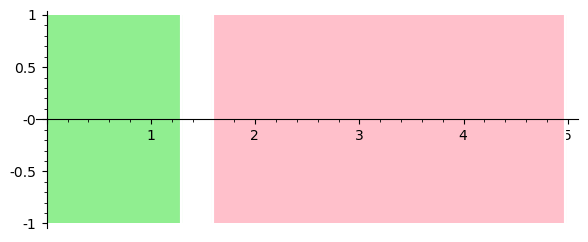

In [17]:
sig = csig.refined_signal(4)
sig.plot()

Precomposed systems in 1.4543533325195312e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 116 flowpipes in 1.087677240371704 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2ef14b60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2000000000000002], [[0.59999999999999997 .. 1.2000000000000002], [3.0999999999999996 .. 4.2000000000000002]]))
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.74

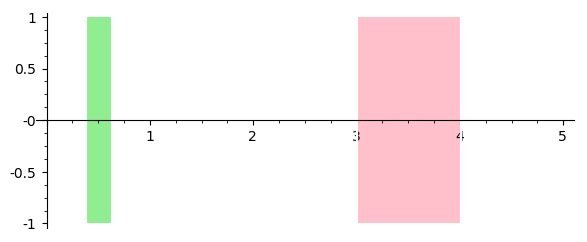

In [12]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
    mask=Mask(RIF(0, 5), [RIF(0.5, 1), RIF(3, 4)]),
)
sig.plot()

Precomposed systems in 8.821487426757812e-06 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 115 flowpipes in 1.2856132984161377 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2eeeae60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.0010000000000004], [[0.0000000000000000 .. 5.0010000000000004]]))
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.74295457113491081 .. 2.3821495701276457]]
domai

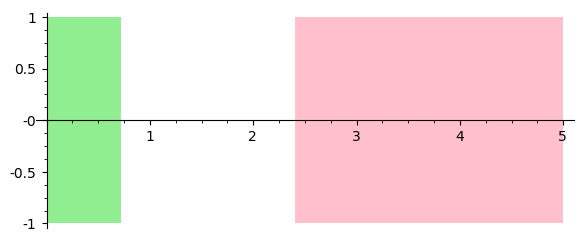

In [13]:
sig = P.signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

In [14]:
P

Atomic(x^2 + y^2 - 2.00000000000000*x + 0.800000000000000)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 115 flowpipes in 5.9604644775390625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20

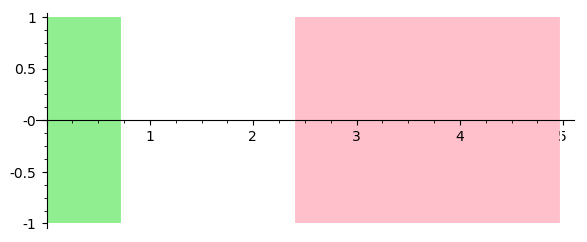

In [15]:
ctx_sig = P.context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

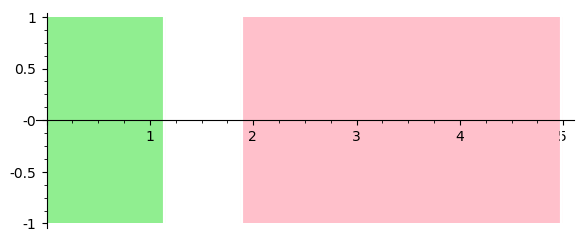

In [16]:
ctx_sig.refined_signal(2).plot()

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 116 flowpipes in 5.7220458984375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2f7725c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20000

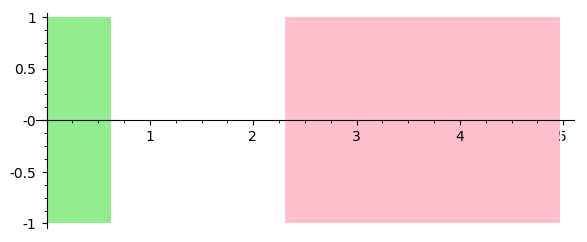

In [17]:
ctx_sig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

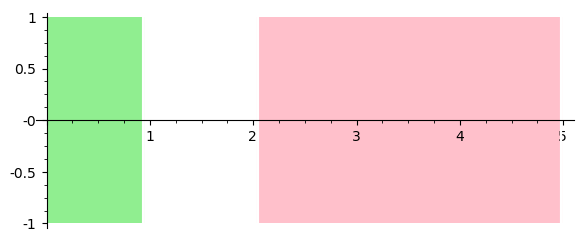

In [18]:
ctx_sig.refined_signal(1).plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[1.4517558020903533 .. 1.9256113124197121]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4517558020903533 .. 1.9256113124197121]]
seg_domain = [0.10000000000000000 .. 5.2009999999999997]
roots = [[1.4517558020903533 .. 1.9256113124197121]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 

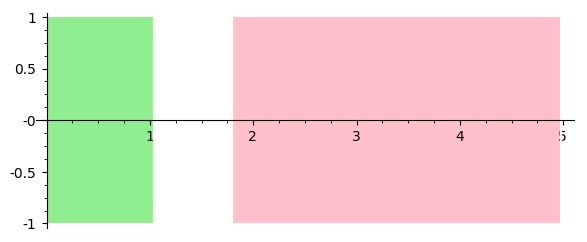

In [19]:
ctx_sig.refined_signal(2).plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[1.7855153397905449 .. 1.8309787678486591], [1.9965111094081589 .. 2.0630741144280363], [2.1068036755050179 .. 2.2695891656523908]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7855153397905449 .. 1.8309787678486591], 
 [1.9965111094081589 .. 2.0630741144280363], 
 [2.1068036755050179 .. 2.2695891656523908]]
seg_domain = [0.10000000000000000 .. 5.2009999999999997]
roots = [[1.7855153397905449 .. 1.8309787678486591], 
 [1.9965111094081589 .. 2.0630741144280363], 
 [2.1068036755050179 .. 2.2695891656523908]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000

roots = [[1.8379356450600787 .. 1.9553797564202578]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8379356450600787 .. 1.9553797564202578]]
seg_domain = [0.10000000000000000 .. 5.2009999999999997]
roots = [[1.8379356450600787 .. 1.9553797564202578]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.2411966026061662 .. 1.8309787678486591]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.2411966026061662 .. 1.8309787678486591]]
seg_domain = [0.10000000000000000 .. 5.2009999999999997]
roots = [[1.2411966026061662 .. 1.8309787678486591]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 

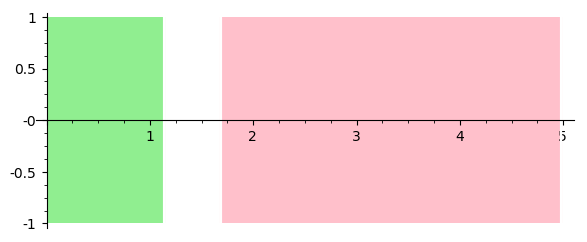

In [20]:
ctx_sig.refined_signal(3).plot()

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 115 flowpipes in 6.198883056640625e-06 sec
PolyObserver(x - 1.1500000000000000?, <flowstar.reachability.Reach object at 0x55fd2ed5a2f0>, 0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000]

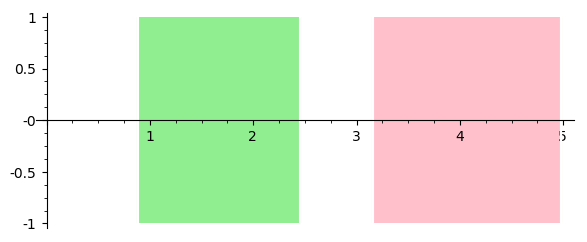

In [21]:
ctx_sig = Atomic(x - 1.15).context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

In [22]:
prop = (F(RIF(0.1, 0.2), P) & Atomic(x - 1.15))
prop

And([F([0.10000000000000000 .. 0.20000000000000002], Atomic(x^2 + y^2 - 2.00000000000000*x + 0.800000000000000)), Atomic(x - 1.15000000000000)])

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 116 flowpipes in 7.3909759521484375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2fad2d00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


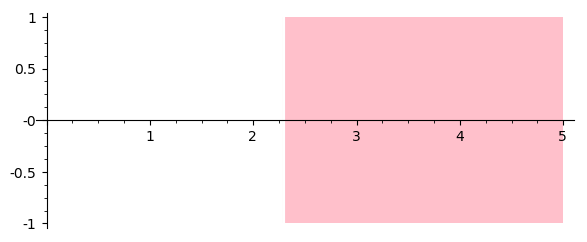

In [23]:
ctx_sig = prop.context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.11559457580890626], [2.7062026654423738 .. 3.0260608437773083]]
domain = [0.0000000000000000 .. 5.200000000000

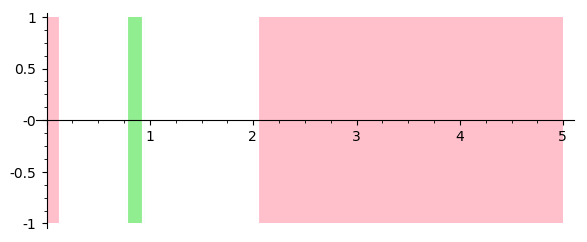

In [24]:
ctx_sig.refined_signal(1).plot()

In [25]:
sig = ctx_sig.refined_signal(2)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 4.3349597772706437e-7], [2.5800374809334414 .. 2.8029326989139425]]
domain = [0.0000000000000000 .. 5.2000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

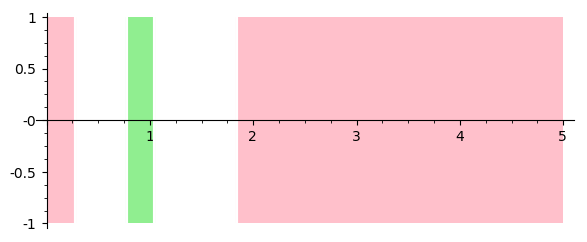

In [26]:
sig.plot()

In [27]:
sig = ctx_sig.refined_signal(3)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.13618140624999994 .. 0.26576649997882740], [2.6357330429199472 .. 2.7398666141710835]]
domain = [0.0000000000000000 .. 5.20000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.29695538190782228 .. 0.43637576639265908], [2.9771943226854578 .. 3.0750331284433710]]
domain = [0.00000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.10853698207010926 .. 0.18851977068646312], [2.8520234111232336 .. 2.9126302317134090]]
domain = [0.0000000000000000 .. 5.20000000000

roots = [[1.7478453931174386 .. 1.9248188706339733]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.064313750934766267 .. 0.16169221088372160], [2.6340167

var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.052964824622861630 .. 0.12428243475852273], [2.7978369267521783 .. 2.8602865833933518]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.052964824622861630 .. 0.12428243475852273], 
 [2.7978369267521783 .. 2.8602865833933518]]
seg_domain

roots = [[1.2618070544506290 .. 1.8623066570540936]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.2618070544506290 .. 1.8623066570540936]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.2618070544506290 .. 1.8623066570540936]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 5.9307219206800596e-7], [2.7634700851126403 .. 2.8386293164615167]]
domain = [0.0000000000000000 .. 5.2000000000

roots = [[1.6088211646931234 .. 1.8104830548403493]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6088211646931234 .. 1.8104830548403493]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6088211646931234 .. 1.8104830548403493]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 4.5446752356530734e-7], [2.8202142333409150 .. 2.8995220094770021]]
domain = [0.0000000000000000 .. 5.2000000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 4.3646481884793339e-7], [2.8407085718251692 .. 2.9237652801337886]]
domain = [0.0000000

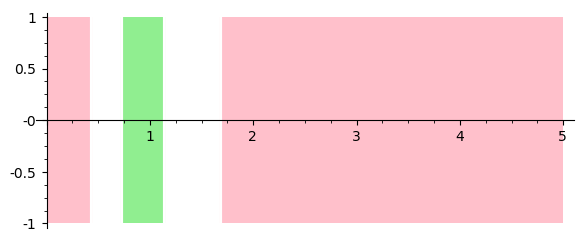

In [28]:
sig.plot()

In [30]:
sig = ctx_sig.refined_signal(4)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[0.46006885717545970 .. 0.61240524767563532], [2.6386651093218613 .. 2.7151796938444571]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.46006885717545970 .. 0.61240524767563532], 
 [2.6386651093218613 .. 2.7151796938444571]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.46006885717545970 .. 0.61240524767563532], 
 [2.6386651093218613 .. 2.7151796938444571]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.47024694245936299 .. 0.60113653913437537], [2.7712224949135264 .. 2.8342259733374303]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.47024694245936299 .. 0.60113653913437537], 
 [2.7712224949135264 .. 2.8342259733374303]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.47024694245936299 .. 0.60113653913437537], 
 [2.7712224949135264 .. 2.8342259733374303]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.39756371561357689 .. 0.52892304726154960], [2.6421409500310786 .. 2.7139995522661500]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.39756371561357689 .. 0.52892304726154960], 
 [2.6421409500310786 .. 2.7139995522661500]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.39756371561357689 .. 0.52892304726154960], 
 [2.6421409500310786 .. 2.7139995522661500]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.32596400002930886 .. 0.42943279736694446], [2.6891488619260499 .. 2.7478696894463921]]
domain = [0.0000000000000000 .. 5.20000000000

PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.30407596059647090 .. 0.39030872573402182], [2.7598549077431928 .. 2.8101451818077199]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.30407596059647090 .. 0.39030872573402182], 
 [2.7598549077431928 .. 2.8101451818077199]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.30407596059647090 .. 0.39030872573402182], 
 [2.7598549077431928 .. 2.8101451818077199]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b

roots = [[0.38425025630918624 .. 0.48038745975872860], [2.8345077631762460 .. 2.8830924814078914]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.38425025630918624 .. 0.48038745975872860], 
 [2.8345077631762460 .. 2.8830924814078914]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.38425025630918624 .. 0.48038745975872860], 
 [2.8345077631762460 .. 2.8830924814078914]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[2.0770208960565006 .. 2.1532443997443354]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0770208960565006 .. 2.1532443997443354]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0770208960565006 .. 2.1532443997443354]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.28401482474407074 .. 0.35807049482276327], [2.8201166721102115 .. 2.8623226038256005]]
domain = [0.0000000000000000 .. 5.20000000000

PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.28506687115692613 .. 0.38236710244629230], [2.6459224306809852 .. 2.7105416073067446]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.28506687115692613 .. 0.38236710244629230], 
 [2.6459224306809852 .. 2.7105416073067446]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.28506687115692613 .. 0.38236710244629230], 
 [2.6459224306809852 .. 2.7105416073067446]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b

 [2.7139995522661193 .. 2.7733470590258485]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.19999999

symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.18879140951120665 .. 0.25980669059849354], [2.6469553903058047 .. 2.7039765610158724]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.18879140951120665 .. 0.25980669059849354], 
 [2.6469553903058047 .. 2.7039765610158724]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.18879140951120665 .. 0.25980669059849354], 
 [2.6469553903058047 .. 2.7039765610158724]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + (

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.8546259292438964 .. 1.9242636661670376]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8546259292438964 .. 1.9242636661670376]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(spac

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.19162580164423698 .. 0.24504138286674621], [2.8298737480193847 .. 2.8655729042398553]]
domain = [0.0000000000000000 .. 5.20000000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.40045591720921680 .. 0.48826077692306608], [2.9264807267432422 .. 2.9686698346293743]]
domain = [0.0000000000000000 .. 5.20000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[2.0198278982352326 .. 2.0924323705307280]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0198278982352326 .. 2.0924323705307280]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0198278982352326 .. 2.0924323705307280]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots = [[1.9889428975584622 .. 2.0770188450259264]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9889428975584622 .. 2.0770188450259264]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9889428975584622 .. 2.0770188450259264]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.29344947270411064 .. 0.35463767163360960], [3.0153648174776446 .. 3.0642191595659929]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.29344947270411064 .. 0.35463767163360960], 
 [3.0153648174776446 .. 3.0642191595659929]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.29344947270411064 .. 0.35463767163360960], 
 [3.0153648174776446 .. 3.0642191595659929]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.17496276177026706 .. 0.22109131645437680], [2.8904779063581353 .. 2.9237562765330601]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.17496276177026706 .. 0.22109131645437680], 
 [2.8904779063581353 .. 2.9237562765330601]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.17496276177026706 .. 0.22109131645437680], 
 [2.8904779063581353 .. 2.9237562765330601]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.13989423458036090 .. 0.18190589838495283], [2.8809392165571576 .. 2.9121634482806771]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.13989423458036090 .. 0.18190589838495283], 
 [2.8809392165571576 .. 2.9121634482806771]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.13989423458036090 .. 0.18190589838495283], 
 [2.8809392165571576 .. 2.9121634482806771]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.17902711855220723 .. 0.22122047647581850], [2.9838379397820622 .. 3.0272229431114850]]
domain = [0.0000000000000000 .. 5.20000000000

roots = [[1.7975300715779554 .. 1.8757670398849480]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7975300715779554 .. 1.8757670398849480]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7975300715779554 .. 1.8757670398849480]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.031249999999999996 .. 0.069513204258465467], [2.6719248355802216 .. 2.7201427926766893]]
domain = [0.000000

roots = [[0.0000000000000000 .. 0.030882925611976118], [2.7191902846187852 .. 2.7641478960992223]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.030882925611976118], 
 [2.7191902846187852 .. 2.7641478960992223]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.030882925611976118], 
 [2.7191902846187852 .. 2.7641478960992223]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[1.7456026820145016 .. 1.8231142894088422]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7456026820145016 .. 1.8231142894088422]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7456026820145016 .. 1.8231142894088422]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.029735115836841686], 
 [2.7428791139979584 .. 2.7827452591618656]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.029735115836841686], 
 [2.7428791139979584 .. 2.7827452591618656]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * 

domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.027679940665183638], 
 [2.7841157058399317 .. 2.8201801281446480]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.027679940665183638], 
 [2.7841157058399317 .. 2.8201801281446480]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * 

roots = [[2.6305829136332623 .. 2.6916365672230534]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.6305829136332623 .. 2.6916365672230534]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.6305829136332623 .. 2.6916365672230534]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.6808779833641005 .. 2.7331715920533589]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.6808779833641005 .. 2.73317

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.7304772061719173 .. 2.7736763338692079]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.7304772061719173 .. 2.77367

roots = [[1.4539675467561339 .. 1.7155430758438120]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4539675467561339 .. 1.7155430758438120]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(spac

res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.7747191959907624 .. 2.8142989028107782]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.7747191959907624 .. 2.8142989028107782]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.7747191959907624 .. 2.8142989028107782]]
self.reach.vars = [x, y]
var_names

roots = [[1.6907949041482193 .. 1.7863142972604447]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6907949041482193 .. 1.7863142972604447]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6907949041482193 .. 1.7863142972604447]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.023668876935489958 .. 0.050540776033502690], [2.8566822635360149 .. 2.8913958477936111]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.023668876935489958 .. 0.050540776033502690], 
 [2.8566822635360149 .. 2.8913958477936111]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.023668876935489958 .. 0.050540776033502690], 
 [2.8566822635360149 .. 2.8913958477936111]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.080000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.071828986985994255 .. 0.10260085474423038], [2.9026725373296873 .. 2.9370339627948568]]
domain = [0.0000000000000000 .. 5.2000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.043028240369855093 .. 0.068539739885038726], [2.9245741639860352 .. 2.9645438445563519]]
domain = [0.0000000000000000 .. 5.200000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 3.5217809100117402e-8], [2.8250425511683712 .. 2.8606291225080183]]
domain = [0.0000000

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[1.4732316940336160 .. 1.4781961657863801], [1.4915037463837395 .. 1.7068480342521393]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4732316940336160 .. 1.4781961657863801], 
 [1.4915037463837395 .. 1.7068480342521393]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4732316940336160 .. 1.4781961657863801], 
 [1.4915037463837395 .. 1.7068480342521393]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.600000

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

roots = [[2.8460024162660082 .. 2.8952867590824854]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8460024162660082 .. 2.8952867590824854]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8460024162660082 .. 2.8952867590824854]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

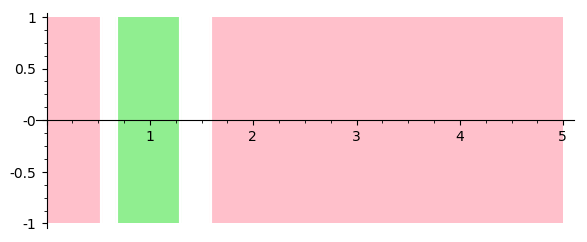

In [31]:
sig.plot()

In [32]:
sig = ctx_sig.refined_signal(5)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[0.55454839564330138 .. 0.64191480039720395], [2.6445951711742301 .. 2.6876605166639914], [3.1719017688963107 .. 3.2770394973190649]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.55454839564330138 .. 0.64191480039720395], 
 [2.6445951711742301 .. 2.6876605166639914], 
 [3.1719017688963107 .. 3.2770394973190649]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.55454839564330138 .. 0.64191480039720395], 
 [2.6445951711742301 .. 2.6876605166639914], 
 [3.1719017688963107 .. 3.2770394973190649]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[0.50591048978891051 .. 0.58265386974581779], 
 [2.6728770411340714 .. 2.7107361602082949]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.50591048978891051 .. 0.58265386974581779], 
 [2.6728770411340714 .. 2.7107361602082949]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.80000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.48902202199810429 .. 0.55372247746835302], [2.7781309194752141 .. 2.8082257512754252]]
domain = [0.0000000000000000 .. 5.20000000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.46582543627064426 .. 0.52911754076026707], [2.7568716027823385 .. 2.7873412674648411]]
domain = [0.00000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.43754928823784400 .. 0.50459897072853877], [2.6744413333908907 .. 2.7093954217906942]]
domain = [0.0000000000000000 .. 5.20000000000

roots = [[0.39773824116447559 .. 0.45634271203156685], [2.6953764266077335 .. 2.7266592700901114]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.39773824116447559 .. 0.45634271203156685], 
 [2.6953764266077335 .. 2.7266592700901114]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.39773824116447559 .. 0.45634271203156685], 
 [2.6953764266077335 .. 2.7266592700901114]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.40380828007033736 .. 0.45870437299048561], [2.7535574198079544 .. 2.7817602581515382]]
domain = [0.0000000000000000 .. 5.20000000000

symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.1183457566329759 .. 2.1578196432933346]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1183457566329759 .. 2.1578196432933346]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.1183457566329759 .. 2.1578196432933346]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] *

roots = [[2.0799325010617581 .. 2.1206033713330519]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0799325010617581 .. 2.1206033713330519]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0799325010617581 .. 2.1206033713330519]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.34002218815468204 .. 0.38553698634976436], [2.7661838863756122 .. 2.7919843788178147]]
domain = [0.00000000

roots = [[2.2250193523537769 .. 2.2670518153853916]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.2250193523537769 .. 2.2670518153853916]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.2250193523537769 .. 2.2670518153853916]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.45356744198238091 .. 0.50831532513066081], [2.8465122561020139 .. 2.8714955150327115]]
domain = [0.00000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.43198749553703469 .. 0.48490005125332942], [2.8263298966289864 .. 2.8519386231866153]]
domain = [0.00000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.39568562145570246 .. 0.44309306291901796], [2.8379322035344203 .. 2.8386293164615167], [2.8388125465696800 .. 2.8619434081010056]]
d

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[0.40948104434316084 .. 0.45641571976921358], [2.8714784836917814 .. 2.8942921393794361]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.40948104434316084 .. 0.45641571976921358], 
 [2.8714784836917814 .. 2.8942921393794361]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.40948104434316084 .. 0.45641571976921358], 
 [2.8714784836917814 .. 2.8942921393794361]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.39626792132829319 .. 0.43936864864057379], [2.8977043930355304 .. 2.9183768331502420]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.39626792132829319 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.33007777907209118 .. 0.36862648571228513], [2.8577784264257521 .. 2.8783956435176306]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.33007777907209118 .. 0.36862648571228513], 
 [2.8577784264257521 .. 2.8783956435176306]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.33007777907209118 .. 0.36862648571228513], 
 [2.8577784264257521 .. 2.8783956435176306]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.31959095887311600 .. 0.35517312615029912], [2.8824848989345479 .. 2.9021114730091365]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.31959095887311600 .. 0.35517312615029912], 
 [2.8824848989345479 .. 2.9021114730091365]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.31959095887311600 .. 0.35517312615029912], 
 [2.8824848989345479 .. 2.9021114730091365]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.28180506989440945 .. 0.31580072054756204], [2.8490133048099850 .. 2.8682767081789722]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.28180506989440945 .. 0.31580072054756204], 
 [2.8490133048099850 .. 2.8682767081789722]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.28180506989440945 .. 0.31580072054756204], 
 [2.8490133048099850 .. 2.8682767081789722]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.27301545299591678 .. 0.30444882164294646], [2.8727635506205899 .. 2.8910435161661799]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.27301545299591678 

seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.29025022900107960 .. 0.33560429027593853], 
 [2.6743933943273763 .. 2.7038052267761446]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[0.26312410038431705 .. 0.30034531061085657], [2.7588382674178784 .. 2.7823048839606522]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.26312410038431705 .. 0.30034531061085657], 
 [2.7588382674178784 .. 2.7823048839606522]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.26312410038431705 .. 0.30034531061085657], 
 [2.7588382674178784 .. 2.7823048839606522]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.21031095047684342 .. 0.24503818063375952], [2.6899835589561176 .. 2.7148702568822616]]
domain = [0.00000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[0.17395544799557777 .. 0.20197472571923004], [2.7491776042543412 .. 2.7709052160396333]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.17395544799557777 .. 0.20197472571923004], 
 [2.7491776042543412 .. 2.7709052160396333]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.17395544799557777 .. 0.20197472571923004], 
 [2.7491776042543412 .. 2.7709052160396333]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.13158672410121441 .. 0.15539912296187642], [2.7571682705995694 .. 2.7765622056353037]]
domain = [0.00000000

roots = [[2.0026398847754363 .. 2.0383945181276886]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0026398847754363 .. 2.0383945181276886]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0026398847754363 .. 2.0383945181276886]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots = [[1.9754550215686825 .. 2.0063533655333524]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9754550215686825 .. 2.0063533655333524]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9754550215686825 .. 2.0063533655333524]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.23689904925514621 .. 0.26704463825049002], [2.8404890430294273 .. 2.8585685305172919]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.23689904925514621 .. 0.26704463825049002], 
 [2.8404890430294273 .. 2.8585685305172919]]
seg_domain =

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.18652072008448114 .. 0.21060405503474206], [2.8643937731042994 .. 2.8803384895556113]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.18652072008448114 .. 0.21060405503474206], 
 [2.8643937731042994 .. 2.8803384895556113]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.18652072008448114 .. 0.21060405503474206], 
 [2.8643937731042994 .. 2.8803384895556113]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , 

roots = [[1.8985082418669516 .. 1.9283276600661885]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8985082418669516 .. 1.9283276600661885]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8985082418669516 .. 1.9283276600661885]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.12716269031298532 .. 0.14961189676250539], [2.7824512943923012 .. 2.8003323804846887]]
domain = [0.0000000000000000 .. 5.20000000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[2.0613858017149295 .. 2.0970510301158245]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.0613858017149295 .. 2.0970510301158245]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(spac

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.25618142806366667 .. 0.28459958938436919], [2.9144912437037824 .. 2.9317706940536033]]
domain = [0.0000000000000000 .. 5.20000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.24468494892027625 .. 0.27156000263623837], [2.9405995452541318 .. 2.9595051723022441]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.24468494892027625 .. 0.27156000263623837], 
 [2.9405995452541318 .. 2.9595051723022441]]
seg_domain = [0.0000000000000000 .. 5.20000000000

roots = [[0.34684010192807868 .. 0.38156049122139879], [3.0292446681892930 .. 3.0535249347057288]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.34684010192807868 .. 0.38156049122139879], 
 [3.0292446681892930 .. 3.0535249347057288]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.34684010192807868 .. 0.38156049122139879], 
 [3.0292446681892930 .. 3.0535249347057288]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.36479077043604468 .. 0.40120564981793644], [3.0440338142758780 .. 3.0700516738126478]]
domain = [0.0000000000000000 .. 5.20000000000

seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.35074894351989177 .. 0.38499119510136487], 
 [3.0634282255571960 .. 3.0895758447767002]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[1.9542269964045539 .. 1.9971998285596778]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9542269964045539 .. 1.9971998285596778]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9542269964045539 .. 1.9971998285596778]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.24895420475612792 .. 0.27434662403276378], [3.0234622071014234 .. 3.0469811941343501]]
domain = [0.00000000

roots = [[1.9177414001839441 .. 1.9730982443974026]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9177414001839441 .. 1.9730982443974026]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9177414001839441 .. 1.9730982443974026]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots = [[1.9387702983497745 .. 1.9704644704492236]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9387702983497745 .. 1.9704644704492236]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.9387702983497745 .. 1.9704644704492236]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots = [[1.9042669213292757 .. 1.9355251090748949]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.18352602632162978 .. 0.20715818493936597], [2.87436117

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.19998254352928410 .. 0.22331557013270276], [2.9439860620192770 .. 2.9627732888808196]]
domain = [0.0000000000000000 .. 5.20000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.16017926775540780 .. 0.18155321878053854], [2.8870905996108877 .. 2.9036458222058470]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.16017926775540780 .. 0.18155321878053854], 
 [2.8870905996108877 .. 2.9036458222058470]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.16017926775540780 .. 0.18155321878053854], 
 [2.8870905996108877 .. 2.9036458222058470]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , 

roots = [[1.8207837232007271 .. 1.8512643443177693]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8207837232007271 .. 1.8512643443177693]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8207837232007271 .. 1.8512643443177693]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.15316326140569727 .. 0.17343028252488422], 
 [2.9120402789303208 .. 2.9282812422449847]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.15316326140569727 .. 0.17343028252488422], 
 [2.9120402789303208 .. 2.9282812422449847]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.20666171194025928 .. 0.22954981392402818], [2.9776192501944720 .. 2.9978313178196259]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.20666171194025928 .. 0.22954981392402818], 
 [2.9776192501944720 .. 2.9978313178196259]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.20666171194025928 .. 0.22954981392402818], 
 [2.9776192501944720 .. 2.9978313178196259]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.18676634171072450 .. 0.20809424622732828], [2.9772235247461158 .. 2.9973250103652203]]
domain = [0.0000000000000000 .. 5.20000000000

symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[1.8516895061693761 .. 1.9000821137460875]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8516895061693761 .. 1.9000821137460875]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8516895061693761 .. 1.9000821137460875]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[1.8132128229763972 .. 1.8547533396174068]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.8132128229763972 .. 1.8547533396174068]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(spac

roots = [[0.13682477759818317 .. 0.15498135547849629], [2.9640632969465907 .. 2.9842205252662742]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.13682477759818317 .. 0.15498135547849629], 
 [2.9640632969465907 .. 2.9842205252662742]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.13682477759818317 .. 0.15498135547849629], 
 [2.9640632969465907 .. 2.9842205252662742]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.12867843384015414 .. 0.15641345531799248], [2.6519126965160548 .. 2.6783420643605159]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.12867843384015414 .. 0.15641345531799248], 
 [2.6519126965160548 .. 2.6783420643605159]]
seg_domain = [0.0000000000000000 .. 5.20000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.083426666472421057 .. 0.10559381239183441], [2.6960319432022816 .. 2.7189101505405589]]
domain = [0.0000000000000000 .. 5.2000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.064280303846114300 .. 0.084528702416534055], 
 [2.7076036422037219 .. 2.7303074141928896]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.00000000

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[1.7363051191298024 .. 1.7937915246855130]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7363051191298024 .. 1.7937915246855130]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7363051191298024 .. 1.7937915246855130]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.089912615371481305 .. 0.10989746856684262], [2.7871454327237201 .. 2.8046948495137989]]
domain = [0.0000000000000000 .. 5.2000000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.057059266963339336 .. 0.074225302250173098], [2.7907584312857927 .. 2.8083207425560302]]
domain = [0.000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.071288638746467666 .. 0.089210215844942334], [2.8046846275473815 .. 2.8215531274155992]]
domain = [0.0000000000000000 .. 5.200000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.069032005417934666 .. 0.086262310689321609], [2.8239875501928946 .. 2.8394915460228339]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.069032005417934666 .. 0.086262310689321609], 
 [2.8239875501928946 .. 2.8394915460228339]]
seg_doma

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.013880471754121794 .. 0.029082039975140348], [2.7594688578035233 .. 2.7792391941352817]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.013880471754121794 .. 0.029082039975140348], 
 [2.7594688578035233 .. 2.7792391941352817]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.013880471754121794 .. 0.029082039975140348], 
 [2.7594688578035233 .. 2.7792391941352817]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.039513338277389696 .. 0.054523037954224696], [2.8250896084338132 .. 2.8405608763085946]]
domain = [0.000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.013128569056032814], [2.8051566603050126 .. 2.8222713204093131]]
domain = [0.0000000000000000 .. 5.20000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[1.6098337386410206 .. 1.7068480342521393]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6098337386410206 .. 1.7068480342521393]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6098337386410206 .. 1.7068480342521393]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.6858339971274745 .. 2.7139995522661500]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.6858339971274745 .. 2.7139995522661500]]
seg_domain = [0.0000000

res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 3.7134476191099818e-9], [2.7742072313170154 .. 2.7929350701573386]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 3.7134476191099818e-9], 
 [2.7742072313170154 .. 2.7929350701573386]]
seg_domain = [0.0000000000000000 .. 5.200000000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

roots = [[2.7803942359080666 .. 2.7989979257381963]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.7803942359080666 .. 2.7989979257381963]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.7803942359080666 .. 2.7989979257381963]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.7861172430847456 .. 2.8046091364073563]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.7861172430847456 .. 2.80460

roots = [[2.7996016180222169 .. 2.8175822692918056]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[1.5814650546291766 .. 1.6830291504160014]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5814650546291766 .. 1.6830291504160014]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5814650546291766 .. 1.6830291504160014]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots = [[1.5568019883667094 .. 1.5579710201261683], [1.5588265163923582 .. 1.6641513512524265]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5568019883667094 .. 1.5579710201261683], 
 [1.5588265163923582 .. 1.6641513512524265]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5568019883667094 .. 1.5579710201261683], 
 [1.5588265163923582 .. 1.6641513512524265]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.600000

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[1.5220543880512313 .. 1.6641290908379538]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5220543880512313 ..

roots = [[1.7733904698898179 .. 1.8056698318991172]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7733904698898179 .. 1.8056698318991172]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7733904698898179 .. 1.8056698318991172]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.089125524761573746 .. 0.10555397470164580], [2.8977236316909102 .. 2.9137514181968661]]
domain = [0.0000000000000000 .. 5.2000000000

roots = [[0.048428547183506615 .. 0.062502346561636155], [2.8826522295822365 .. 2.9001981528606300]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.048428547183506615 .. 0.062502346561636155], 
 [2.8826522295822365 .. 2.9001981528606300]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.048428547183506615 .. 0.062502346561636155], 
 [2.8826522295822365 .. 2.9001981528606300]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.038295025044314132 .. 0.052844278013750135], [2.8421620485942011 .. 2.8574506376970464]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.038295025044314132 .. 0.052844278013750135], 
 [2.8421620485942011 .. 2.8574506376970464]]
seg_doma

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.012352046970712950], [2.8367484123476658 .. 2.8537769181866888]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.012352046970712950], 
 [2.8367484123476658 .. 2.8537769181866888]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.012352046970712950], 
 [2.8367484123476658 .. 2.8537769181866888]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + (

 [2.8579754376579113 .. 2.8759287725406689]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[0.0000000000000000 .. 0.011833292934523394], 
 [2.8579754376579113 .. 2.8759287725406689]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.00000

roots = [[1.7413883414844086 .. 1.7841548091247739]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7413883414844086 .. 1.7841548091247739]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.7413883414844086 .. 1.7841548091247739]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

roots = [[1.6790426817895527 .. 1.7389232918390254]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.032744071816380913 .. 0.045304285476553984], [2.914166

roots = [[1.6303083927596737 .. 1.7068480342521393]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6303083927596737 .. 1.7068480342521393]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.6303083927596737 .. 1.7068480342521393]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8619099109998238 .. 2.8815596272874089]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8619099109998238 .. 2.8815596272874089]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x)

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

roots = [[1.4956732875973806 .. 1.6486245117809180]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4956732875973806 .. 1.6486245117809180]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.4956732875973806 .. 1.6486245117809180]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

roots = [[1.5786107816589678 .. 1.6776553916127724]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.8747542865138173 .. 2.8962274038662011]]
domain = [0.0

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[2.8895313970133829 .. 2.9118630292547856]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8895313970133829 .. 2.91186

roots = [[1.5224298193848224 .. 1.6632091911730571]]
domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5224298193848224 .. 1.6632091911730571]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[1.5224298193848224 .. 1.6632091911730571]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y)) symbolic_composition=True, tentative_unpreconditioning=True, m

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8769645637307097 .. 2.9016663551077811]]
seg_domain = [0.0000000000000000 .. 5.2000000000000002]
roots = [[2.8769645637307097 .. 2.9016663551077811]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x)

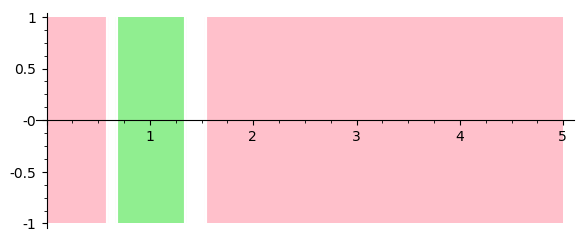

In [33]:
sig.plot()

### Polynomial plot

In [34]:
p + reach.sage_interval_plot('x', 'y',
                             poly=(x - 1)^2 + y^2 - 0.2,
                             aspect_ratio='automatic')

NameError: name 'reach' is not defined

## Context

In [18]:
kwargs = dict(
    order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    verbosity=0,
    epsilon_ctx=0.1,
#    symbolic_composition=True,
)
args = (vf, v3, 7)

In [19]:
{x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)

C({x: [0.050000000000000002 .. 0.10000000000000001]}, G([0.0000000000000000 .. 0.20000000000000002], Atomic(x^2 + y^2 - 2.00000000000000*x + 0.800000000000000)))

In [20]:
sig = ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 10, **kwargs)

Precomposing Contexts: 1 items in 0.00 seconds
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
integrationScheme = 2
Running Flow*: 1 items in 0.58 seconds
Computed 143 flowpipes in 0.5835721260002629 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
integrationScheme = 2
Running Flow*: 1 items in 0.02 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle

Running Flow*: 1 items in 0.02 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0876194686193838 .. 1.5941056213198548]'), ('None', '[0.72592737690616604 .. 3.3285306321854691]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0876194686193839..1.5941056213198548]
S = [0.725927376906166..3.328530632185469]
integrationScheme = 2
Running Flow*: 1 items in 0.02 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0876194686193838 .. 1.5861585606406468]'), ('None', '[0.92305137509755152 .. 3.3285306321854691]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0876194686193839..1.5861585606406468]
S = [0.9230513750975515..3.328530632185469]
integrationScheme = 2
Running Flow*: 1 items in 0.02 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1025833273151515 .. 1.5941056213198548]'), ('None', '[0.7259273769061

Running Flow*: 1 items in 0.06 seconds
Computed 11 flowpipes in 0.058599949999916134 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d5e53da0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.200000000

Running Flow*: 1 items in 0.06 seconds
Computed 11 flowpipes in 0.06201562000001104 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d5ec51a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.2000000000

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1543991624430043 .. 1.4297350960892592]'), ('None', '[-0.15079600686049930 .. 1.0312199387529038]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1543991624430043..1.4297350960892592]
S = [-0.1507960068604993..1.0312199387529037]
integrationScheme = 2
Running Flow*: 1 items in 0.05 seconds
Computed 7 flowpipes in 0.045281772999942405 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d5f46870>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-

Running Flow*: 1 items in 0.04 seconds
Computed 6 flowpipes in 0.03616400700002487 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d5f98370>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000

Running Flow*: 1 items in 0.04 seconds
Computed 6 flowpipes in 0.03756976299996495 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d5fe7750>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d602cf10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.00000000000000*x + 0.800000000000000 > 0): 1 items in 0.02 seconds
Monitored

Running Flow*: 1 items in 0.02 seconds
Computed 3 flowpipes in 0.02269185899990589 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d6072bd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d60a19c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.00000000000000*x + 0.800000000000000 > 0): 1 items in 0.03 seconds
Monitored

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0412802207113940 .. 1.1606133337051144]'), ('None', '[-0.11669460132892153 .. 0.26323310010116425]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.041280220711394..1.1606133337051143]
S = [-0.11669460132892152..0.26323310010116424]
integrationScheme = 2
Running Flow*: 1 items in 0.02 seconds
Computed 3 flowpipes in 0.024285519999921235 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d60e7740>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1

roots = [[0.0000000000000000 .. 0.13125000000000001], [0.20156468481216655 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.13125000000000001], 
 [0.20156468481216655 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.13125000000000001], 
 [0.20156468481216655 .. 0.20199999999900001]]
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.00000000000000*x + 0.800000000000000 > 0): 1 items in 0.02 seconds
Monitored signal in 0.024449019999792654 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0296961159510034 .. 1.1257422082788944]'), ('None', '[-0.085542345305066936 .. 0.19180626569002363]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0296961159510034..1.1257422082788944]
S = [-0.08554234530506694..0.19180626569002363]
integrationScheme = 2
Running Flow*: 1

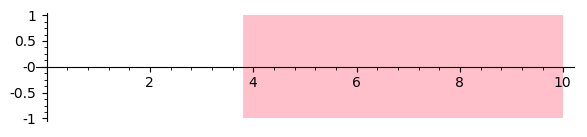

In [38]:
sig.plot()

In [21]:
sigM = ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)
sigM

Precomposing Contexts: 1 items in 0.00 seconds
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
integrationScheme = 2
Running Flow*: 1 items in 0.58 seconds
Computed 143 flowpipes in 0.5820300400002907 sec
mask = Mask([0.0000000000000000 .. 10.001000000000002], [[0.0000000000000000 .. 10.001000000000002]])
mask = Mask([0.0000000000000000 .. 10.001000000000002], [[0.0000000000000000 .. 10.001000000000002]])
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
integrationScheme = 2
Running Flow*: 1 items in 0.02 seconds
calling reach with 

Running Flow*: 1 items in 0.03 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0876194686193838 .. 1.5861585606406468]'), ('None', '[0.92305137509755152 .. 3.3285306321854687]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0876194686193839..1.5861585606406468]
S = [0.9230513750975515..3.3285306321854686]
integrationScheme = 2
Running Flow*: 1 items in 0.03 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1025833273151515 .. 1.5941056213198548]'), ('None', '[0.72592737690616515 .. 3.0116224052850269]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1025833273151515..1.5941056213198548]
S = [0.7259273769061652..3.011622405285027]
integrationScheme = 2
Running Flow*: 1 items in 0.03 seconds
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1119824976172880 .. 1.5959882036700564]'), ('None', '[0.43931855994

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.00000000000000*x + 0.800000000000000 > 0): 1 items in 0.06 seconds
Monitored signal in 0.05956626799979858 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1556179570719804 .. 1.5594396454719455]'), ('None', '[0.061157558039720075 .. 1.8482582496368485]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1556179570719805..1.5594396454719455]
S = [0.061157558039720075..1.8482582496368485]
integrationScheme = 2
Running Flow*: 1 items in 0.07 seconds
Computed 12 flowpipes in 0.06754930499982947 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.00000000000000*x + 0.800000000000000 > 0): 1 items in 0.05 seconds
Monitored signal in 0.04968498299967905 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1619834643444533 .. 1.5265972538249127]'), ('None', '[-0.0060158164158723438 .. 1.5500961839720100]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1619834643444533..1.5265972538249126]
S = [-0.006015816415872344..1.55009618397201]
integrationScheme = 2
Running Flow*: 1 items in 0.06 seconds
Computed 11 flowpipes in 0.05986734099997193 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowsta

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d6487350>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.0000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d64ddc30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitoring Signal for G([0.0000000000000000 .. 0.20000000000000002], x^2 + y^2 - 2.0000000

Running Flow*: 1 items in 0.04 seconds
Computed 6 flowpipes in 0.03949229799991372 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d652e960>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999

Running Flow*: 1 items in 0.02 seconds
Computed 3 flowpipes in 0.024187982000057673 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d6574100>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.2019999999

Running Flow*: 1 items in 0.03 seconds
Computed 3 flowpipes in 0.025212680999857184 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d65b5400>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.2019999999

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0532038754601917 .. 1.1927069426580031]'), ('None', '[-0.12755722393882521 .. 0.31777093455576716]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0532038754601918..1.192706942658003]
S = [-0.1275572239388252..0.31777093455576716]
integrationScheme = 2
Running Flow*: 1 items in 0.03 seconds
Computed 3 flowpipes in 0.02897098499988715 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d65ef730>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbo

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0424362473006385 .. 1.1643355494483190]'), ('None', '[-0.11619259551921219 .. 0.26314493593253819]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0424362473006386..1.164335549448319]
S = [-0.11619259551921218..0.2631449359325382]
integrationScheme = 2
Running Flow*: 1 items in 0.03 seconds
Computed 3 flowpipes in 0.028004567000152747 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d662ad50>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symb

Running Flow*: 1 items in 0.03 seconds
Computed 3 flowpipes in 0.027123363000100653 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x5574d666a700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.2019999999

Signal([0.0000000000000000 .. 10.000000000000000], [([0.0000000000000000 .. 0.078132812500000010], True), ([3.8285078125000007 .. 10.000000000000000], False)], mask=Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]]))

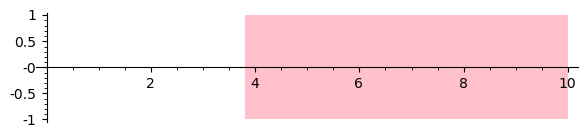

In [22]:
sigM.plot()

In [41]:
sigM.mask

Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]])

In [42]:
%%time
sigG = G(RIF(10.2, 10.3), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, **kwargs)

Precomposed systems in 3.075599670410156e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 145 flowpipes in 1.274183988571167 sec
In G.signal
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9999848661864812..1.5959882046269047]
S = [-0.18566626

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0927060926435441 .. 1.5889401520751510]'), ('None', '[0.87256830864270684 .. 3.2416935975195776]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0927060926435441..1.588940152075151]
S = [0.8725683086427068..3.2416935975195775]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1054243391186473 .. 1.5959882046269048]'), ('None', '[0.70353768107801073 .. 2.9382567484765825]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1054243391186473..1.5959882046269047]
S = [0.7035376810780107..2.9382567484765825]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1206858209593233 .. 1.5926445232344713]'), ('None', '[0.39635810587957198 .. 2.6459192859966745]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1206858209593233..1.5926445232344713]
S = [

Computed 11 flowpipes in 0.12504816055297852 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3318c6e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.1224660873413086 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Computed 9 flowpipes in 0.09865379333496094 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33225bd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.08199214935302734 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Computed 6 flowpipes in 0.10129523277282715 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd332acbc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.058626651763916016 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1235086486455641 .. 1.3256124442482083]'), ('None', '[-0.17084556752495678 .. 0.66704332691050372]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.123508648645564..1.3256124442482082]
S = [-0.17084556752495678..0.6670433269105037]
Computed 6 flowpipes in 0.07172131538391113 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd332fe540>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.2019999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03433632850646973 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1024292710205090 .. 1.2769062857557663]'), ('None', '[-0.17057402835150390 .. 0.52120334354885012]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.102429271020509..1.2769062857557663]
S = [-0.1705740283515039..0.5212033435488501]
Computed 3 flowpipes in 0.04735755920410156 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33354880>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*

Computed 3 flowpipes in 0.0432286262512207 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33394d30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03215360641479492 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd333eef90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07996487617492676 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0487136445495726 .. 1.18367449711636

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33419bb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.034592628479003906 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0367129800224130 .. 1.1515866497590

In [43]:
sigG(0)

False

In [44]:
%%time
sigG = G(RIF(10.2, 10.3), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

Precomposed systems in 3.790855407714844e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 145 flowpipes in 1.2488174438476562 sec
In G.signal
mask = Mask([0.0000000000000000 .. 10.301000000000002], [[10.199999999999999 .. 10.301000000000002]])
mask = Mask([0.0000000000000000 .. 10.301000000000002], [[10.199999999999999 .. 10.301000000000002]])
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99904786189732996 .. 1.0056246182309452]'), ('None', '[-0.0062191321833736432 .. 0.010711199615616205]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.99904786189733..1.0056246182309452]
S = [-0.006219132183373643..0.010711199615616205]
Computed 2 flowpipes in 0.02305150032043457 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowsta

In [45]:
%%time
sigG = F(RIF(5, 5.1),
         {y: RIF(1, 1.5)} >>
         G(RIF(10.2, 10.3),
           {x: RIF(0.05,0.1)} >>
            G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, **kwargs)

Precomposed systems in 5.7697296142578125e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 115 flowpipes in 1.1523358821868896 sec
mask = None
calling reach with y0 = [('None', '[0.99998486618648119 .. 1.5959882046269048]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [0.9999848661864812..1.5959882046269047]
C = [1.0..1.5]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('None', '[0.99998486618648119 .. 1.5959882046269048]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [0.9999848661864812..1.5959882046269047]
C = [1.0..1.5]
S = [-0.18566626515230494..6.00011

calling reach with y0 = [('None', '[1.1185255552318211 .. 1.5926445232344713]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[0.56000042373989789 .. 2.6855383203156449]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.1185255552318212..1.5926445232344713]
C = [1.0..1.5]
S = [0.5600004237398979..2.685538320315645]
calling reach with y0 = [('None', '[1.1314800553260966 .. 1.5908737634701784]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[0.42919776359120498 .. 2.4143908242044048]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.1314800553260966..1.5908737634701784]
C = [1.0..1.5]
S = [0.429197763591205..2.4143908242044048]
calling reach with y0 = [('None', '[1.1415581562773222 .. 1.5836895302131338]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[0.038820226933202278 .. 2.1867816452631228]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.1415581562773223..1.5836895302131337]
C = [1.0..1.5]
S = [0.0388202269

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0818226316898396 .. 1.6356761884569351]'), ('None', '[-0.34696446604187931 .. 1.7232270115773083]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0818226316898396..1.635676188456935]
S = [-0.3469644660418793..1.7232270115773083]
Computed 15 flowpipes in 0.17137932777404785 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33b457e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999

Computed 11 flowpipes in 0.1293628215789795 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33be6cd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.12968683242797852 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0252665644950773 .. 1.4545232960569799]'), ('None', '[-0.32795313462669524 .. 0.90184961564505917]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0252665644950774..1.4545232960569798]
S = [-0.32795313462669523..0.9018496156450592]
Computed 9 flowpipes in 0.10295844078063965 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33c60bf0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05302309989929199 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0501554509218307 .. 1.3721731372834179]'), ('None', '[-0.27836953216927113 .. 0.66585110585546082]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0501554509218307..1.3721731372834178]
S = [-0.2783695321692711..0.6658511058554608]
Computed 6 flowpipes in 0.07211470603942871 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33cf56b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33d4b340>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.055179595947265625 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0437784854940512 .. 1.3062538985487

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03585100173950195 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0301291005073907 .. 1.2437782807128639]'), ('None', '[-0.19516329187890533 .. 0.38710283421758269]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0301291005073907..1.243778280712864]
S = [-0.19516329187890533..0.3871028342175827]
Computed 3 flowpipes in 0.04911494255065918 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33da6eb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x

Computed 3 flowpipes in 0.052985191345214844 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33df6210>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.029967546463012695 sec
calling reach with y0 = [('[0.050000000000000002 .. 0

Computed 3 flowpipes in 0.04962658882141113 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33e37370>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03618645668029785 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd33e88c10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03557944297790527 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0064250535335863 .. 1.12060940857092

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0309931574239452 .. 1.6198268332127051]'), ('None', '[-0.13837994717450428 .. 2.3393228485669018]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0309931574239453..1.619826833212705]
S = [-0.13837994717450428..2.3393228485669018]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0291008109950492 .. 1.6198737126513903]'), ('None', '[-0.20776823160900787 .. 2.1895591131656263]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0291008109950492..1.6198737126513902]
S = [-0.20776823160900787..2.1895591131656262]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0257103418996456 .. 1.6124792898420164]'), ('None', '[-0.31651537925069973 .. 2.0452983576980377]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0257103418996456..1.6124792898420164

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd340e6400>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.12123417854309082 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0330885193653009 .. 1.50807122393998

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.11483454704284668 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0234239555844064 .. 1.4348364735048301]'), ('None', '[-0.41404883238263674 .. 1.0455903377761738]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0234239555844065..1.43483647350483]
S = [-0.41404883238263673..1.0455903377761737]
Computed 9 flowpipes in 0.1087026596069336 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3419e470>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^

Computed 8 flowpipes in 0.09314727783203125 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd341f42d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.09141969680786133 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd34272be0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.049004316329956055 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0039331519778973 .. 1.2869375006143

Computed 5 flowpipes in 0.11675167083740234 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd342d6850>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0700230598449707 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.09795451164245605 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0009375393817863 .. 1.2123412154654863]'), ('None', '[-0.24457338016284655 .. 0.42839370354762880]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0009375393817863..1.2123412154654862]
S = [-0.24457338016284655..0.4283937035476288]
Computed 3 flowpipes in 0.058000802993774414 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd34143b90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?

_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9919799980269609..1.1705029147584982]
S = [-0.21215552170713156..0.34350751761823495]
Computed 3 flowpipes in 0.04929661750793457 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3434c930>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3437f7d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07182025909423828 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99406066934624615 .. 1.1422247135480

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0556330680847168 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99120437136316086 .. 1.1174339503360860]'), ('None', '[-0.15001767363059843 .. 0.23466814507024303]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9912043713631609..1.117433950336086]
S = [-0.15001767363059842..0.23466814507024303]
Computed 3 flowpipes in 0.051638126373291016 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd343c8c10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.1000000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd344177a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.16668012932468137 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.16668012932468137 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.16668012932468137 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd338da430>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07019805908203125 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0078452772286459 .. 1.27468315877792

Computed 7 flowpipes in 0.09317684173583984 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd337fe460>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06677412986755371 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd344377b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05493521690368652 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0133428020050350 .. 1.27745632458608

In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd344a59e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05460214614868164 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0177259047203128 .. 1.23

S = [1.0226895520920516..1.2023063153540376]
S = [-0.061448030526947264..0.6571110478848422]
Computed 3 flowpipes in 0.04284048080444336 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd344fefb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monito

roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0883791446685791 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0195937874185840 .. 1.1679021036614406]'), ('None', '[-0.073800992282124487 .. 0.50652897560651656]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.019593787418584..1.1679021036614405]
S = [-0.07380099228212449..0.5065289756065166]
Computed 3 flowpipes in 0.054114341735839844 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd34550fe0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentativ

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd34581be0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03265023231506348 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0129469205427814 .. 1.13485785159802

Computed 3 flowpipes in 0.04885268211364746 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd345cbc90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03298521041870117 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06473851203918457 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0129469205427814 .. 1.0987653851069344]'), ('None', '[-0.052383652579693151 .. 0.27002192560874678]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0129469205427815..1.0987653851069343]
S = [-0.05238365257969315..0.27002192560874677]
Computed 2 flowpipes in 0.037235260009765625 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3433e660>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unprecondit

In [46]:
%%time
sigG = F(RIF(5, 5.1),
         {y: RIF(1, 1.5)} >>
         G(RIF(10.2, 10.3),
           {x: RIF(0.05,0.1)} >>
            G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

Precomposed systems in 5.984306335449219e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 115 flowpipes in 1.1289350986480713 sec
mask = Mask([0.0000000000000000 .. 5.1010000000000000], [[5.0000000000000000 .. 5.1010000000000000]])
mask = Mask([0.0000000000000000 .. 5.1010000000000000], [[5.0000000000000000 .. 5.1010000000000000]])
calling reach with y0 = [('None', '[1.0112939853473539 .. 1.0714799218102973]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.055341024645701252 .. 0.11024717083180576]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.011293985347354..1.0714799218102973]
C = [1.0..1.5]
S = [-0.05534102464570125..0.11024717083180575]
Computed 70 flowpipes in 0.41150879859924316 sec
In G.signal
mask = Mask([0.0000000000000000 .. 10.302000000000002], [[10.199999999999999 .. 

In [47]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 0, **kwargs)

Precomposed systems in 5.984306335449219e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 92 flowpipes in 0.9122421741485596 sec
In G.signal
mask = None
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [0.9999848661864812..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[0.061157558039720075 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [0.9999848661864812..1.5959882046269047]
S = [0.0611575580397

calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[1.1284902187088168 .. 1.5919057415045621]'), ('None', '[0.43828838456531626 .. 2.4750285233359155]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [1.1284902187088168..1.591905741504562]
S = [0.43828838456531627..2.4750285233359155]
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[1.1379828460313845 .. 1.5869431775806682]'), ('None', '[0.061157558039720075 .. 2.2583897269492224]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [1.1379828460313846..1.5869431775806682]
S = [0.061157558039720075..2.2583897269492224]
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[1.1379828460313845 .. 1.5869431775806682]'), ('None', '[0.21554507936345740 .. 2.2583897269492224]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [1.1379828460313846..1.5869431775806682]
S = [0.

calling reach with y0 = [('None', '[1.1014951318811780 .. 1.6296511348037095]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.39145517975372813 .. 1.0163105991696853]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.101495131881178..1.6296511348037095]
C = [1.0..1.5]
S = [-0.3914551797537281..1.0163105991696852]
calling reach with y0 = [('None', '[1.1137090739930990 .. 1.6296511348037095]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.39145517975372813 .. 1.0163105991696853]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.113709073993099..1.6296511348037095]
C = [1.0..1.5]
S = [-0.3914551797537281..1.0163105991696852]
Computed 150 flowpipes in 1.3150627613067627 sec
In G.signal
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98607394383208757 .. 1.6862970315801032]'), ('None', '[-0.47324033906096064 .. 2.5492528031257252]')]
ode in polynomial ring
_handle_initials called!
vars = [x,

S = [1.0304634001613142..1.6170981012797168]
S = [-0.43251010490250447..1.5074506053293004]
Computed 15 flowpipes in 0.15963125228881836 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd34f54a80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monito

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd350008d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.12878179550170898 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0226968029502110 .. 1.47132031486901

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35097290>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0734262466430664 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0149962441839419 .. 1.399637799886633

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0596470832824707 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0102788114826692 .. 1.3267963455198269]'), ('None', '[-0.36426089952406493 .. 0.64604375535972325]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0102788114826693..1.3267963455198268]
S = [-0.36426089952406493..0.6460437553597232]
Computed 6 flowpipes in 0.07538604736328125 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3510a060>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?

seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05175137519836426 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0039041330394569 .. 1.2943036520080074]'), ('None', '[-0.34491109614708554 .. 0.57802044471725012]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.003904133039457..1.2943036520080073]
S = [-0.34491109614708554..0.5780204447172501]
Computed 6 flowpipes in 0.06958413124084473 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35159830>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioni

S = [-0.28062667066240027..0.44225726970173024]
Computed 3 flowpipes in 0.04334855079650879 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd351b1140>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03621792793273926 sec
calling

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd351f68a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03775644302368164 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99371071288560786 .. 1.1951310909320

Computed 3 flowpipes in 0.04412031173706055 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3524b0b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03339648246765137 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.032303810119628906 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98899509931949680 .. 1.1194089214504346]'), ('None', '[-0.17042740098926277 .. 0.23966199595287547]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9889950993194968..1.1194089214504346]
S = [-0.17042740098926276..0.23966199595287546]
Computed 3 flowpipes in 0.043515920639038086 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd352a2d60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.20000000000000

0 at 0.201000000000001
Monitored signal in 0.08147382736206055 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98610749426762556 .. 1.0971545477173664]'), ('None', '[-0.14758989273076287 .. 0.20107788084851289]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9861074942676256..1.0971545477173663]
S = [-0.14758989273076287..0.20107788084851289]
Computed 3 flowpipes in 0.04448509216308594 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd352e80e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, ep

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35378100>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.1592106819152832 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0683291131371530 .. 1.603225851660415

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.11849093437194824 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0334214162490573 .. 1.5168328444327597]'), ('None', '[-0.36454696530969705 .. 1.2690026666487853]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0334214162490574..1.5168328444327597]
S = [-0.36454696530969705..1.2690026666487852]
Computed 11 flowpipes in 0.11889314651489258 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd354afee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0338729435942324 .. 1.4099651812094976]'), ('None', '[-0.35167746988600496 .. 0.90926605566058061]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0338729435942324..1.4099651812094975]
S = [-0.35167746988600496..0.9092660556605806]
Computed 8 flowpipes in 0.09520554542541504 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd355493b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05763554573059082 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0224264424327580 .. 1.3317055877404889]'), ('None', '[-0.31457082182468360 .. 0.68916478461457798]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.022426442432758..1.3317055877404889]
S = [-0.3145708218246836..0.689164784614578]
Computed 6 flowpipes in 0.07436919212341309 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd355ea570>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y

Computed 6 flowpipes in 0.07128310203552246 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35635cb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04931211471557617 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Computed 3 flowpipes in 0.04665374755859375 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd356a4500>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03930306434631348 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0024230452320519 .. 1.1609461098446572]'), ('None', '[-0.19138495706390130 .. 0.31919742665942763]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.002423045232052..1.1609461098446572]
S = [-0.1913849570639013..0.31919742665942763]
Computed 3 flowpipes in 0.07764506340026855 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35705db0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.2019999999

Computed 3 flowpipes in 0.04337453842163086 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3572cd90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.031940460205078125 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd357671b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03322005271911621 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0008215583622632 .. 1.11451178400416

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99562924730226864 .. 1.5501266073847753]'), ('None', '[-0.32320210764448610 .. 2.2534723250157676]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9956292473022686..1.5501266073847753]
S = [-0.3232021076444861..2.2534723250157676]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99656603226417839 .. 1.5501266073847753]'), ('None', '[-0.32320210764448610 .. 2.2534723250157676]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9965660322641784..1.5501266073847753]
S = [-0.3232021076444861..2.2534723250157676]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0093690295317265 .. 1.5501266073847753]'), ('None', '[-0.32320210764448610 .. 2.2534723250157676]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0093690295317266..1.550126607384775

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0339304200700165 .. 1.5501266073847753]'), ('None', '[0.043578627236848674 .. 1.9102418611221848]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0339304200700166..1.5501266073847753]
S = [0.043578627236848674..1.9102418611221847]
Computed 13 flowpipes in 0.14474081993103027 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35896c90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.13097453117370605 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0217751411612674 .. 1.5198545876266024]'), ('None', '[-0.21962661646376786 .. 1.4919645260674730]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0217751411612674..1.5198545876266023]
S = [-0.21962661646376785..1.491964526067473]
Computed 12 flowpipes in 0.13433074951171875 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35930660>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x

Computed 8 flowpipes in 0.09759974479675293 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35a12230>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0782768726348877 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35a9a7c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05114126205444336 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0214177615080970 .. 1.33658447401569

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35aff120>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04744982719421387 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0169863942300705 .. 1.27349939325700

domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07845544815063477 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0111852907811851 .. 1.2270238653772461]'), ('None', '[-0.24260649795930745 .. 0.49368730132651179]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0111852907811851..1.227023865377246]
S = [-0.24260649795930744..0.4936873013265118]
Computed 3 flowpipes in 0.04506206512451172 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd356e6840>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35ba1130>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03671669960021973 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0039530530691034 .. 1.18456069707803

Computed 3 flowpipes in 0.06670475006103516 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35bcd7b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.035860300064086914 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35c0c610>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03394508361816406 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0039530536223413 .. 1.13672670134643

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0011454379003184 .. 1.1188768168027566]'), ('None', '[-0.14645568618499739 .. 0.25566305307573701]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0011454379003184..1.1188768168027565]
S = [-0.14645568618499738..0.255663053075737]
Computed 3 flowpipes in 0.044638633728027344 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35c32be0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
Monitored signal in 0.026556730270385742 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99656603226417839 .. 1.0881674710459213]'), ('None', '[-0.10729022948031785 .. 0.18845574805877078]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9965660322641784..1.0881674710459213]
S = [-0.10729022948031784..0.18845574805877077]
Computed 2 flowpipes in 0.03242993354797363 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35c6b690>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)

Computed 12 flowpipes in 0.13179898262023926 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35d330f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.12369251251220703 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35e23d60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.10470414161682129 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99488225292506704 .. 1.4292775639433

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35ec5ad0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.08259844779968262 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0043684663171541 .. 1.37817657312717

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0044951997728932 .. 1.3240414939722403]'), ('None', '[-0.24653103084530018 .. 0.91724592362548641]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0044951997728933..1.3240414939722402]
S = [-0.24653103084530018..0.9172459236254864]
Computed 6 flowpipes in 0.12197017669677734 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35f26cb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35fc7c90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0500638484954834 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0105503400653845 .. 1.246307765373339

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3601faa0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04658794403076172 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0069021954847159 .. 1.20446758114795

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3608b110>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.034911155700683594 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0080750468561607 .. 1.1544310567683

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35cf6fd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04012608528137207 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0056347695390086 .. 1.12885038182559

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0682218074798584 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0028658917461961 .. 1.1067297627654842]'), ('None', '[-0.12927576542537228 .. 0.26697335165556302]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0028658917461961..1.1067297627654842]
S = [-0.12927576542537228..0.266973351655563]
Computed 3 flowpipes in 0.049135684967041016 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3610aaa0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3612f400>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06356334686279297 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99792859551809909 .. 1.2176313644973

C = [0.05..0.1]
S = [1.0007378412885215..1.2176313644973622]
S = [0.5214961376259258..1.5541332699795374]
Computed 6 flowpipes in 0.09605002403259277 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd35c75ec0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000

Computed 6 flowpipes in 0.07390570640563965 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36192e20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.053938865661621094 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

Computed 3 flowpipes in 0.04347038269042969 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd361fb310>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03250861167907715 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03198862075805664 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0219747238095060 .. 1.1737533937809837]'), ('None', '[0.027261146164649661 .. 0.66959628278249184]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.021974723809506..1.1737533937809836]
S = [0.027261146164649662..0.6695962827824918]
Computed 3 flowpipes in 0.04214167594909668 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd362289a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0264980893085966 .. 1.1399519969458148]'), ('None', '[0.025813792547912460 .. 0.48785138826379016]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0264980893085967..1.1399519969458147]
S = [0.02581379254791246..0.48785138826379015]
Computed 3 flowpipes in 0.042569875717163086 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36277c90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.029274940490722656 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0224610489757310 .. 1.1008643183383007]'), ('None', '[0.00052309453850456731 .. 0.31525695099963825]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.022461048975731..1.1008643183383007]
S = [0.0005230945385045673..0.31525695099963824]
Computed 2 flowpipes in 0.030312061309814453 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd362f8460>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100000000000

C = [1.0..1.5]
S = [-0.39006956237572743..1.8864463848343713]
calling reach with y0 = [('None', '[1.0734902595602395 .. 1.7736636797611905]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.39006956237572743 .. 1.8864463848343714]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.0734902595602396..1.7736636797611904]
C = [1.0..1.5]
S = [-0.39006956237572743..1.8864463848343713]
calling reach with y0 = [('None', '[1.1171265815347319 .. 1.7736636797611905]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.38665262674432522 .. 1.8864463848343714]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.117126581534732..1.7736636797611904]
C = [1.0..1.5]
S = [-0.3866526267443252..1.8864463848343713]
calling reach with y0 = [('None', '[1.1533146266823925 .. 1.7736636797611905]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.34667053988540076 .. 1.8864463848343714]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.15

Computed 11 flowpipes in 0.12414693832397461 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd368bc080>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.1061563491821289 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3699d760>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07606983184814453 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0195089370241985 .. 1.37346798688510

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05730891227722168 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0098254563447897 .. 1.2867044132572952]'), ('None', '[-0.32252983020048104 .. 0.55151057389713665]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0098254563447897..1.2867044132572951]
S = [-0.32252983020048104..0.5515105738971366]
Computed 6 flowpipes in 0.07353830337524414 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36a4cbe0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36a944f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07816076278686523 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998602467597708 .. 1.2315965015473

_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0004683626438033..1.1933192218520345]
S = [-0.23780761303058642..0.36804983909530825]
Computed 3 flowpipes in 0.10824775695800781 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36aeb240>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000

Computed 3 flowpipes in 0.08862519264221191 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36b33ce0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04165363311767578 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36b7f1e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06274127960205078 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99396933032839074 .. 1.1139569245914

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36bcb1d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = []
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = []
Monitored signal in 0.02460026741027832 sec
Monitored signal in 16.938611030578613 sec
calling reach with y0 = [('None', '[1.0734902595602395 .. 1.6002292276681845]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.39006956237572743 .. 0.92918945160651734]')]
ode in polynomial ring
_handle_initials called

Computed 12 flowpipes in 0.1575024127960205 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36dea190>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.14847421646118164 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36ed04b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.09246516227722168 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0001025023227105 .. 1.42871781158688

vars = [x, y]
C = [0.05..0.1]
S = [0.9960075272783264..1.3613035520539098]
S = [-0.43206523249909456..0.8045359212908778]
Computed 8 flowpipes in 0.11064743995666504 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36f4d200>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]


PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36fbcf40>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.08407926559448242 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99416858980925648 .. 1.2923110983644

Computed 5 flowpipes in 0.14516973495483398 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd370384d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.14141416549682617 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.10710954666137695 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98841077935721011 .. 1.2055856500879794]'), ('None', '[-0.29544908212313998 .. 0.44969332917865490]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9884107793572101..1.2055856500879794]
S = [-0.29544908212313997..0.4496933291786549]
Computed 3 flowpipes in 0.061051368713378906 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37077e90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100000000000000

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98249113269340082 .. 1.1758861344863936]'), ('None', '[-0.26868864539086596 .. 0.38996438685187096]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9824911326934008..1.1758861344863936]
S = [-0.26868864539086595..0.38996438685187096]
Computed 3 flowpipes in 0.05530977249145508 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd370a4fb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.2019999

Computed 3 flowpipes in 0.05835103988647461 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd370e0a80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.058248043060302734 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03916597366333008 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98322835610731473 .. 1.1249356521162968]'), ('None', '[-0.20263462735624003 .. 0.28319451003219054]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9832283561073147..1.1249356521162968]
S = [-0.20263462735624002..0.28319451003219054]
Computed 3 flowpipes in 0.05169105529785156 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37125dd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100000000000000

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03596758842468262 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98219175843474315 .. 1.1048084218817016]'), ('None', '[-0.17653973133687654 .. 0.24085897771690030]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9821917584347432..1.1048084218817016]
S = [-0.17653973133687653..0.2408589777169003]
Computed 3 flowpipes in 0.04582667350769043 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37167b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x

Computed 2 flowpipes in 0.0336155891418457 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd371aac40>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.034746646881103516 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Monitored signal in 20.74174928665161 sec
calling reach with y0 = [('None', '[1.0228942450151372 .. 1.4029591533263770]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.30118490783753244 .. 0.53767432242706948]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.0228942450151373..1.402959153326377]
C = [1.0..1.5]
S = [-0.30118490783753243..0.5376743224270695]
Computed 114 flowpipes in 1.0570213794708252 sec
In G.signal
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99342306642188937 .. 1.4375251679139889]'), ('None', '[-0.24131653255379066 .. 2.0627229436207602]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9934230664218894..1.4375251679139889]
S = [-0.24131653255379065..2.06272294362076]
Computed 12 flowpipes in 0.1435556411743164 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36bceff0>, 0.59999999999999998?*

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd364d8d10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.11265945434570312 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0135612779949871 .. 1.41803508146500

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37204f10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.10791945457458496 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99632849144556312 .. 1.4375251679139

Computed 11 flowpipes in 0.12764382362365723 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3728c690>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.10967898368835449 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0038472167035332 .. 1.3594625273143773]'), ('None', '[-0.20988085259291093 .. 1.0785044942344920]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0038472167035333..1.3594625273143772]
S = [-0.20988085259291092..1.078504494234492]
Computed 8 flowpipes in 0.10412335395812988 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3732d7c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd373a5d90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.10799407958984375 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0100693439733083 .. 1.29288234608488

0 at 0.201000000000001
Monitored signal in 0.058745622634887695 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0059621483729417 .. 1.2533893881457370]'), ('None', '[-0.23164960784533323 .. 0.68386292085626122]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0059621483729417..1.253389388145737]
S = [-0.23164960784533323..0.6838629208562612]
Computed 6 flowpipes in 0.07924842834472656 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd373faa60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsi

In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37442dd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04213666915893555 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0087998346608426 .. 1.21

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03548264503479004 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0069620145417192 .. 1.1813200785416503]'), ('None', '[-0.18907790858784149 .. 0.46744107963197446]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0069620145417193..1.1813200785416502]
S = [-0.1890779085878415..0.46744107963197445]
Computed 3 flowpipes in 0.04700422286987305 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd374881d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0042449151883741 .. 1.1546797409308308]'), ('None', '[-0.17349771915546434 .. 0.39635188987304754]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.004244915188374..1.1546797409308307]
S = [-0.17349771915546433..0.39635188987304754]
Computed 3 flowpipes in 0.04884171485900879 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd374d6090>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

Computed 3 flowpipes in 0.04795503616333008 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37524de0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03473186492919922 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Computed 2 flowpipes in 0.03308510780334473 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37568440>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.066050058517070603 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.066050058517070603 .. 0.12500000000000000]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.066050058517070603 .. 0.12500000000000000]]
Monitored signal in 0.02919602394104004 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]

Computed 6 flowpipes in 0.08237695693969727 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd36624510>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06177663803100586 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

0 at 0.201000000000001
Monitored signal in 0.09230566024780273 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0035435293787617 .. 1.2179884695601928]'), ('None', '[0.36431793773507864 .. 1.3584669223692066]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0035435293787618..1.2179884695601928]
S = [0.36431793773507865..1.3584669223692065]
Computed 6 flowpipes in 0.07629060745239258 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd375898b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd375c7a20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06174063682556152 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0105079251057926 .. 1.21385951836402

Computed 3 flowpipes in 0.04694867134094238 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd376218e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.034569501876831055 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06903457641601562 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0225086256032400 .. 1.1749842948975285]'), ('None', '[0.078617148522317520 .. 0.70104566041247663]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.02250862560324..1.1749842948975284]
S = [0.07861714852231752..0.7010456604124766]
Computed 3 flowpipes in 0.04822659492492676 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd376626e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x s

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37676c10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03433632850646973 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0234390318879611 .. 1.14927654908286

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.033937692642211914 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0267802884160219 .. 1.1325996376405865]'), ('None', '[0.031195859453136642 .. 0.46181913585533430]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.026780288416022..1.1325996376405865]
S = [0.031195859453136642..0.4618191358553343]
Computed 3 flowpipes in 0.04881620407104492 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd376b0aa0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.029219388961791992 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0246767894796540 .. 1.1173903330615130]'), ('None', '[0.015781593481500252 .. 0.38846918969246109]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.024676789479654..1.117390333061513]
S = [0.015781593481500253..0.3884691896924611]
Computed 3 flowpipes in 0.044762372970581055 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd376e49c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37719fb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.031838178634643555 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0207561960478217 .. 1.0988476755406

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37750830>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
Monitored signal in 0.03505897521972656 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0183745259625303 .. 1.0850165676240687]'), ('None', '[-0.00

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99807329239237063 .. 1.5475588091060244]'), ('None', '[-0.50341126643232326 .. 1.3977312527436017]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9980732923923706..1.5475588091060244]
S = [-0.5034112664323233..1.3977312527436017]
Computed 12 flowpipes in 0.14435982704162598 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37d1b270>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999

Computed 9 flowpipes in 0.10768985748291016 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37de3740>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.09197688102722168 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07817935943603516 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99204595418173846 .. 1.3608223382443050]'), ('None', '[-0.44198599601276606 .. 0.81835925387429232]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9920459541817385..1.360822338244305]
S = [-0.44198599601276606..0.8183592538742923]
Computed 8 flowpipes in 0.09606814384460449 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37e7fa50>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37f335b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05443429946899414 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98358971289882690 .. 1.2573805570987

Computed 3 flowpipes in 0.04449200630187988 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37fbf0d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04443836212158203 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Computed 3 flowpipes in 0.04661250114440918 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37ffc4f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.037833452224731445 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06033158302307129 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97599651497312234 .. 1.1585360015694651]'), ('None', '[-0.25995584245144516 .. 0.36390130418663258]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9759965149731223..1.158536001569465]
S = [-0.25995584245144515..0.3639013041866326]
Computed 3 flowpipes in 0.04641914367675781 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3802d310>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001

Computed 3 flowpipes in 0.05387139320373535 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3805f7c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.044055938720703125 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.029996395111083984 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97758948664623457 .. 1.1116224841407172]'), ('None', '[-0.19430879202061203 .. 0.26256316612780035]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9775894866462346..1.1116224841407172]
S = [-0.19430879202061202..0.26256316612780034]
Computed 3 flowpipes in 0.0447084903717041 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd380a2460>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100000000000000

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.18628556999265263 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.18628556999265263 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.18628556999265263 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07513189315795898 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98018769474438771 .. 1.0673282700715459]'), ('None', '[-0.12464271286465903 .. 0.16211779384215769]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9801876947443877..1.0673282700715458]
S = [-0.12464271286465903..0.1621177938421577]
Computed 2 flowpipes in 0.03219938278198242 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97270323963755123 .. 1.5921353397217746]'), ('None', '[-0.43082616614015174 .. 1.7112225964066708]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9727032396375512..1.5921353397217746]
S = [-0.43082616614015173..1.7112225964066707]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97183843986127627 .. 1.5801718508612491]'), ('None', '[-0.54263267055574316 .. 1.6324488516896641]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9718384398612763..1.580171850861249]
S = [-0.5426326705557432..1.632448851689664]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97183843986127627 .. 1.5801718508612491]'), ('None', '[-0.53247003026042817 .. 1.6324488516896641]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9718384398612763..1.580171850861249

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.1191105842590332 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98091095179536746 .. 1.4572236296944064]'), ('None', '[-0.54263267055574316 .. 1.1915497924605379]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9809109517953675..1.4572236296944063]
S = [-0.5426326705557432..1.1915497924605378]
Computed 11 flowpipes in 0.12831449508666992 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38394850>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38468a40>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07702064514160156 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97475505003196760 .. 1.3644079820760

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd384eeab0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.06291580200195312 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97208249619358155 .. 1.3030432515700

seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.09279990196228027 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.96956520113455280 .. 1.2471988741977514]'), ('None', '[-0.39909028368689931 .. 0.60737780762532668]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9695652011345528..1.2471988741977513]
S = [-0.3990902836868993..0.6073778076253267]
Computed 6 flowpipes in 0.08962750434875488 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3855e490>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unprecondition

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.96670187881092828 .. 1.2262995926721481]'), ('None', '[-0.38295179691015153 .. 0.56178765285475596]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9667018788109283..1.226299592672148]
S = [-0.3829517969101515..0.561787652854756]
Computed 6 flowpipes in 0.0823671817779541 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd385ab2e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.201999999999

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.96501910851922767 .. 1.1733565486247275]'), ('None', '[-0.31507004520695181 .. 0.43693999489351526]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9650191085192277..1.1733565486247275]
S = [-0.3150700452069518..0.43693999489351526]
Computed 3 flowpipes in 0.07700037956237793 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38623650>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.09894657135009766 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.96887525057905454 .. 1.1362726537317658]'), ('None', '[-0.25751405598350258 .. 0.34792267904667402]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9688752505790545..1.1362726537317658]
S = [-0.2575140559835026..0.347922679046674]
Computed 3 flowpipes in 0.07064652442932129 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38666070>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.96779183060148676 .. 1.1164360541457421]'), ('None', '[-0.23174274039566409 .. 0.30323330957304018]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9677918306014868..1.116436054145742]
S = [-0.2317427403956641..0.3032333095730402]
Computed 3 flowpipes in 0.04715776443481445 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd386a6600>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.2019999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.052310943603515625 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97169786368248889 .. 1.0836248888141833]'), ('None', '[-0.17203905662518774 .. 0.21979073240543285]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9716978636824889..1.0836248888141833]
S = [-0.17203905662518773..0.21979073240543284]
Computed 3 flowpipes in 0.05163407325744629 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3873fd90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd381b4820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.1288468837738037 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97398206725040981 .. 1.41902282006161

Monitored signal in 0.1382615566253662 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98858943502091134 .. 1.4057311954578864]'), ('None', '[0.34736591650816478 .. 2.0317511616673932]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9885894350209113..1.4057311954578864]
S = [0.3473659165081648..2.031751161667393]
Computed 11 flowpipes in 0.1379239559173584 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37927bd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
root

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.10844898223876953 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.97637424991375276 .. 1.4142332003282828]'), ('None', '[-0.044779461154891981 .. 1.6007879445496989]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9763742499137528..1.4142332003282827]
S = [-0.04477946115489198..1.6007879445496989]
Computed 11 flowpipes in 0.12305426597595215 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd387a4dc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd388b08a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.1095430850982666 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.98771739866277974 .. 1.32762072670322

In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3893fdf0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.056606292724609375 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99478875702342073 .. 1.

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd389bde20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.04611468315124512 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99694225792514523 .. 1.2153739234317

Computed 3 flowpipes in 0.049072980880737305 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38a1f280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0393369197845459 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

Computed 3 flowpipes in 0.045464277267456055 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38a75da0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.035867929458618164 sec
calling reach with y0 = [('[0.050000000000000002 .. 0

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38ad56b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.037061452865600586 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0009527202873997 .. 1.0932430173000

ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9892534182795988..1.1985722479686984]
S = [0.6158126011486785..1.716854660876844]
Computed 6 flowpipes in 0.07793927192687988 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd37a4c4c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.060929059982299805 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99365888000914515 .. 1.2184204800718393]'), ('None', '[0.34802850329720125 .. 1.4081855099475560]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9936588800091452..1.2184204800718392]
S = [0.34802850329720125..1.408185509947556]
Computed 6 flowpipes in 0.08047175407409668 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38b0b6b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*

S = [1.0027631502004326..1.2127114454651262]
S = [0.16017929542636689..1.0508437673448447]
Computed 5 flowpipes in 0.06605362892150879 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38ba08c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitore

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.0380101203918457 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0146873374992337 .. 1.1728436634503677]'), ('None', '[0.032222950462268737 .. 0.69670644993285081]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0146873374992338..1.1728436634503676]
S = [0.03222295046226874..0.6967064499328508]
Computed 3 flowpipes in 0.047835350036621094 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38bf6fc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38c2c280>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.03417611122131348 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0203101496295097 .. 1.13973473867052

Computed 3 flowpipes in 0.07511377334594727 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38c99380>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.05078721046447754 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored signal in 0.07184171676635742 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0164409252455901 .. 1.1021362119700906]'), ('None', '[-0.015852923812280304 .. 0.33224901653604561]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0164409252455902..1.1021362119700906]
S = [-0.015852923812280303..0.3322490165360456]
Computed 3 flowpipes in 0.05778646469116211 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd38cba730>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100000000000000

In [48]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

Precomposed systems in 4.887580871582031e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 92 flowpipes in 1.1172966957092285 sec
In G.signal
mask = Mask([0.0000000000000000 .. 2.5010000000000004], [[2.0000000000000000 .. 2.5010000000000004]])
mask = Mask([0.0000000000000000 .. 2.5010000000000004], [[2.0000000000000000 .. 2.5010000000000004]])
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[1.1024292680261309 .. 1.3432583110108876]'), ('None', '[-0.17123410778533238 .. 0.71938507293036880]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [1.102429268026131..1.3432583110108876]
S = [-0.17123410778533238..0.7193850729303688]
Computed 56 flowpipes in 0.557999849319458 sec
mask = Mask([0.0000000000000000 .. 5.1020000000000004], [[5.0000000000000000 .. 5.1

In [49]:
sigG(0)

False

In [51]:
sigG

Signal([0.0000000000000000 .. -0.0000000000000000], [([0.0000000000000000 .. -0.0000000000000000], False)], mask=Mask([0.0000000000000000 .. -0.0000000000000000], [[0.0000000000000000 .. -0.0000000000000000]]))

In [54]:
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

Precomposed systems in 4.673004150390625e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 155 flowpipes in 1.3312880992889404 sec
In G.signal
mask = Mask([0.0000000000000000 .. 12.501000000000002], [[2.0000000000000000 .. 12.501000000000002]])
mask = Mask([0.0000000000000000 .. 12.501000000000002], [[2.0000000000000000 .. 12.501000000000002]])
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[0.99863734049121122 .. 1.3432583110108876]'), ('None', '[-0.17123410778533238 .. 0.71938507293036880]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [0.9986373404912112..1.3432583110108876]
S = [-0.17123410778533238..0.7193850729303688]
Computed 63 flowpipes in 0.5722329616546631 sec
mask = Mask([0.0000000000000000 .. 5.1020000000000004], [[5.0000000000000000 ..

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


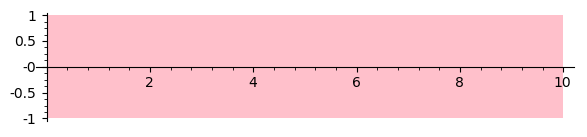

In [55]:
sigG.plot()

## Context signal (masked)

In [63]:
sigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

Precomposed systems in 2.7894973754882812e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 148 flowpipes in 1.2379133701324463 sec
In G.signal
mask = Mask([0.0000000000000000 .. 11.101000000000003], [[1.0000000000000000 .. 11.101000000000003]])
mask = Mask([0.0000000000000000 .. 11.101000000000003], [[1.0000000000000000 .. 11.101000000000003]])
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5727943631722219]'), ('None', '[-0.18566626515230495 .. 2.0609029880732562]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5727943631722219]
S = [-0.18566626515230494..2.060902988073256]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0038105784554185 .. 1.5727943631722219]'), ('No

Computed 11 flowpipes in 0.12907886505126953 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd39fe7680>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitored signal in 0.1363182

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1591354300645018 .. 1.4537739120100424]'), ('None', '[-0.12737120220514387 .. 1.1326709970512241]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1591354300645018..1.4537739120100424]
S = [-0.12737120220514386..1.132670997051224]
Computed 8 flowpipes in 0.09320926666259766 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a3b2f30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a423890>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitored signal in 0.0523686408996582 sec
calling reach with y0 = [('[0.05000000000000000

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0763164819293216 .. 1.2976505720324792]'), ('None', '[-0.17122851558861646 .. 0.58111323868219423]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0763164819293216..1.2976505720324791]
S = [-0.17122851558861646..0.5811132386821942]
Computed 6 flowpipes in 0.07598614692687988 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a4927f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
root

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a4d10b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitored signal in 0.03872346878051758 sec
calling reach with y0 = [('[0.0500000000000000

roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitored signal in 0.03481912612915039 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0420750039968389 .. 1.2170305418559358]'), ('None', '[-0.13473781947058941 .. 0.37013410667198488]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.042075003996839..1.2170305418559357]
S = [-0.1347378194705894..0.3701341066719849]
Computed 3 flowpipes in 0.04447817802429199 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a50d3e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000

Computed 3 flowpipes in 0.04362297058105469 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a558060>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitored signal in 0.03415393

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a5a3ab0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
Monitored signal in 0.033223867416381836 sec
calling reach with y0 = [('[0.050000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a5d0d40>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20200000000000002], [[0.0000000000000000 .. 0.20200000000000002]]))
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = []
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20200000000000002]
roots = []
Monitored signal in 0.025162696838378906 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.0421118125139313]'), ('None', '[-0.036586912992184570 .. 0.0673468674276

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


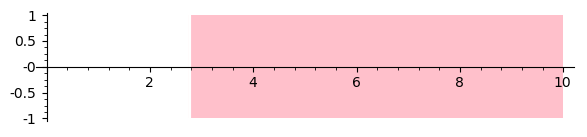

In [64]:
sigG.plot()

In [67]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 148 flowpipes in 5.9604644775390625e-06 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049219643 .. 1.5959882046270193]'), ('None', '[-0.18566626515688304 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404921964..1.5959882046270193]
S = [-0.18566626515688303..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9986373404921964..1.5959882046270193]', '[-0.18566626515688303..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ad9a9a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ada8510>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3adfade0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ae31a30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ae5c2b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ae80ac0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

Computed 12 flowpipes in 5.4836273193359375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3aecfd90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3af0d360>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3af49860>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3af916d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3afcdb30>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b023bc0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.0957341194152832 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1096886211462764 .. 1.3328965694374280]'), ('None', '[-0.17123410779010326 .. 0.69364701207086999]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1096886211462764..1.332896569437428]
S = [-0.17123410779010326..0.69364701207087]
contexts = ['[0.05..0.1]']
statics  = ['[1.1096886211462764..1.332896569437428]', '[-0.17123410779010326..0.69364701207087]']
Computed 6 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b068bb0>, 0.59999999999999998?*x^

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b080d60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b0a36e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b0ba500>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.05817103385925293 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0841479567874083 .. 1.2390326658519369]'), ('None', '[-0.13854863141486657 .. 0.41803675353265435]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0841479567874084..1.2390326658519368]
S = [-0.13854863141486656..0.41803675353265435]
contexts = ['[0.05..0.1]']
statics  = ['[1.0841479567874084..1.2390326658519368]', '[-0.13854863141486656..0.41803675353265435]']
Computed 3 flowpipes in 3.0994415283203125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b0dae90>, 0.599999999999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b0f5fe0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b10dd10>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b132630>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.05853128433227539 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0272581999240841 .. 1.1628512687989679]'), ('None', '[-0.11669477414108378 .. 0.26323320039102605]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0272581999240842..1.1628512687989678]
S = [-0.11669477414108377..0.26323320039102605]
contexts = ['[0.05..0.1]']
statics  = ['[1.0272581999240842..1.1628512687989678]', '[-0.11669477414108377..0.26323320039102605]']
Computed 3 flowpipes in 4.0531158447265625e-06 sec
PolyObser

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b17ed30>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b19d610>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b1aeee0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


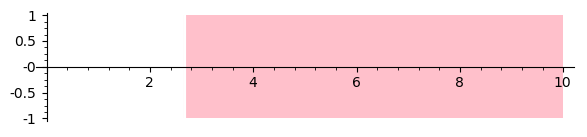

In [68]:
csigG.signal.plot()

mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99938562762067362 .. 1.3844319636599350]'), ('None', '[-0.033154973963680647 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9993856276206736..1.384431963659935]
S = [-0.033154973963680646..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993856276206736..1.384431963659935]', '[-0.033154973963680646..5.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a784170>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001])

self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3a76ff10>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-1.0..1.0]
contexts = ['[-1.0..1.0]']
statics  = []
symbolic_composition=False, tentative_unpreconditioning=True
Monitored initial signal 0.04707479476928711 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998486618648063 .. 1.2475522601390728]'), ('None', '[2.7685606010538554 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9999848661864806..1.2475522601390727]
S = [2.7685606010538555..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9999848661864806..1.2475522601390727]', '[2.7685606010538555..5.000113342080666]']
Computed 12 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a7720d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.200

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3a7d99a0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

Computed 7 flowpipes in 4.0531158447265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a7bd0f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

Computed 6 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a8725f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1737096714813418..1.3724056456556772]
S = [0.5341561899683573..1.3742029962869255]
contexts = ['[0.05..0.1]']
statics  = ['[1.1737096714813418..1.3724056456556772]', '[0.5341561899683573..1.3742029962869255]']
Computed 6 flowpipes in 4.0531158447265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a672960>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t

vars = [x, y]
C = [0.05..0.1]
S = [1.1707064774836677..1.3671842271671377]
S = [0.44248612766628237..1.266821534678474]
contexts = ['[0.05..0.1]']
statics  = ['[1.1707064774836677..1.3671842271671377]', '[0.44248612766628237..1.266821534678474]']
Computed 6 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a6ae2f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a6df340>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.07825303077697754 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1416425337477564 .. 1.3060115740945486]'), ('None', '[0.12780603809832005 .. 0.78329358939080596]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1416425337477565..1.3060115740945486]
S = [0.12780603809832006..0.783293589390806]
contexts = ['[0.05..0.1]']
statics  = ['[1.1416425337477565..1.3060115740945486]', '[0.12780603809832006..0.783293589390806]']
Computed 3 flowpipes in 4.0531158447265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b1e40c0>, 0.59999999999999998?*

0 at 0.201000000000001
Monitored initial signal 0.10147404670715332 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1186031940034144 .. 1.2811770538786032]'), ('None', '[0.050081282797690696 .. 0.66581150740553219]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1186031940034145..1.2811770538786031]
S = [0.050081282797690696..0.6658115074055322]
contexts = ['[0.05..0.1]']
statics  = ['[1.1186031940034145..1.2811770538786031]', '[0.050081282797690696..0.6658115074055322]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b165b20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpr

0 at 0.201000000000001
Monitored initial signal 0.06887388229370117 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1186031940034144 .. 1.2509927568720414]'), ('None', '[0.050326264969379974 .. 0.53750550886428406]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1186031940034145..1.2509927568720414]
S = [0.050326264969379975..0.537505508864284]
contexts = ['[0.05..0.1]']
statics  = ['[1.1186031940034145..1.2509927568720414]', '[0.050326264969379975..0.537505508864284]']
Computed 3 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b22f780>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unp

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0988492329643919 .. 1.2254416988654802]'), ('None', '[0.010294651844762969 .. 0.44820451850922283]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.098849232964392..1.2254416988654802]
S = [0.01029465184476297..0.4482045185092228]
contexts = ['[0.05..0.1]']
statics  = ['[1.098849232964392..1.2254416988654802]', '[0.01029465184476297..0.4482045185092228]']
Computed 3 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b2584f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0582705064802819 .. 1.2049243939646297]'), ('None', '[-0.022638502732983846 .. 0.38223356222226696]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.058270506480282..1.2049243939646297]
S = [-0.022638502732983845..0.38223356222226695]
contexts = ['[0.05..0.1]']
statics  = ['[1.058270506480282..1.2049243939646297]', '[-0.022638502732983845..0.38223356222226695]']
Computed 3 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b280f90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b29c4f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b2d2940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

vars = [x, y]
C = [0.05..0.1]
S = [1.0429451383648614..1.1503361287309846]
S = [-0.033154973963680646..0.25612276334391776]
contexts = ['[0.05..0.1]']
statics  = ['[1.0429451383648614..1.1503361287309846]', '[-0.033154973963680646..0.25612276334391776]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b3007e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0429451383648613 .. 1.1393699804842668]'), ('None', '[-0.033154973963680647 .. 0.23637593084055525]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0429451383648614..1.1393699804842667]
S = [-0.033154973963680646..0.23637593084055525]
contexts = ['[0.05..0.1]']
statics  = ['[1.0429451383648614..1.1393699804842667]', '[-0.033154973963680646..0.23637593084055525]']
Computed 3 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b313c80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b

S = [-0.048580972521121764..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993192090156489..1.4635838212753032]', '[-0.048580972521121764..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b3374b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.400

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b35e3b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1368351472897184 .. 1.4291463413111088]'), ('None', '[1.9672974546862975 .. 3.7096066572727713]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1368351472897185..1.4291463413111087]
S = [1.9672974546862976..3.7096066572727713]
contexts = ['[0.05..0.1]']
statics  = ['[1.1368351472897185..1.4291463413111087]', '[1.9672974546862976..3.7096066572727713]']
Computed 12 flowpipes in 4.5299530029296875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b3c1fb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b43f9c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2417364480385313..1.4552568116576667]
S = [0.6733374148083923..1.6821978279661391]
contexts = ['[0.05..0.1]']
statics  = ['[1.2417364480385313..1.4552568116576667]', '[0.6733374148083923..1.6821978279661391]']
Computed 7 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b49d770>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t'

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b4f1970>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b531350>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

statics  = ['[1.1839378550857644..1.3412991529347784]', '[0.06976417198810891..0.7053607864185676]']
Computed 5 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b56dd00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.13524937629699707 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1656751143457151 .. 1.3146889300240432]'), ('None', '[0.029915747430350636 .. 0.59064580918535637]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1656751143457151..1.3146889300240432]
S = [0.029915747430350637..0.5906458091853564]
contexts = ['[0.05..0.1]']
statics  = ['[1.1656751143457151..1.3146889300240432]', '[0.029915747430350637..0.5906458091853564]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b595640>, 0.59999999999999998?

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b5abe10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b5d35b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

Computed 3 flowpipes in 5.4836273193359375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b600930>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b6232d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b637b90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b660380>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

Computed 3 flowpipes in 6.9141387939453125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b686590>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

S = [1.057168089796013..1.1518367591884495]
S = [-0.04570499113844487..0.20827762847960188]
contexts = ['[0.05..0.1]']
statics  = ['[1.057168089796013..1.1518367591884495]', '[-0.04570499113844487..0.20827762847960188]']
Computed 3 flowpipes in 3.0994415283203125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b694540>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.10000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b6d9210>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b771a00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

statics  = ['[1.235120632232456..1.4604034063562898]', '[0.22708151855146883..1.2471468210322278]']
Computed 6 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b7ec160>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.100000

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.11730623245239258 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2452315386861712 .. 1.4376613459495194]'), ('None', '[0.29983487487759957 .. 1.0178388400753127]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2452315386861712..1.4376613459495193]
S = [0.2998348748775996..1.0178388400753127]
contexts = ['[0.05..0.1]']
statics  = ['[1.2452315386861712..1.4376613459495193]', '[0.2998348748775996..1.0178388400753127]']
Computed 6 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b825120>, 0.59999999999999998?*x

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b87ff60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b8acd50>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1456908910858083 .. 1.2899792625666380]'), ('None', '[-0.030621529895186323 .. 0.45472070130625403]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1456908910858083..1.289979262566638]
S = [-0.030621529895186322..0.454720701306254]
contexts = ['[0.05..0.1]']
statics  = ['[1.1456908910858083..1.289979262566638]', '[-0.030621529895186322..0.454720701306254]']
Computed 3 flowpipes in 5.245208740234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b8ffab0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
re

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b927690>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

0 at 0.201000000000001
Monitored initial signal 0.05436253547668457 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0868775803566270 .. 1.1980714395633579]'), ('None', '[-0.061714194210635190 .. 0.27358301401772284]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.086877580356627..1.1980714395633578]
S = [-0.06171419421063519..0.27358301401772284]
contexts = ['[0.05..0.1]']
statics  = ['[1.086877580356627..1.1980714395633578]', '[-0.06171419421063519..0.27358301401772284]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b984470>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unp

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b9a7160>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b9e55b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3b9f0d20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=False, tentative_unpreconditioning=True
Monitored initial signal 0.08088254928588867 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0999848661864808 .. 1.5675365147506748]'), ('None', '[0.13248079967322257 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0999848661864808..1.5675365147506748]
S = [0.13248079967322257..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[1.0999848661864808..1.5675365147506748]', '[0.13248079967322257..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3b966810>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=T

roots = []
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
Monitored initial signal 0.07815003395080566 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2433599543794553 .. 1.5621552400035206]'), ('None', '[1.2748313559490587 .. 3.9291453301819122]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2433599543794553..1.5621552400035206]
S = [1.2748313559490587..3.929145330181912]
contexts = ['[0.05..0.1]']
statics  = ['[1.2433599543794553..1.5621552400035206]', '[1.2748313559490587..3.929145330181912]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ba62970>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 

Computed 11 flowpipes in 6.67572021484375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bad25e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.3379089381759137 .. 1.5609297347046250]'), ('None', '[0.47555570753449610 .. 1.6400924229452063]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.3379089381759137..1.560929734704625]
S = [0.4755557075344961..1.6400924229452063]
contexts = ['[0.05..0.1]']
statics  = ['[1.3379089381759137..1.560929734704625]', '[0.4755557075344961..1.6400924229452063]']
Computed 8 flowpipes in 5.245208740234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bb13a90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2951397764349152 .. 1.5340360233448205]'), ('None', '[0.13248079967322257 .. 1.2274665884960235]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2951397764349153..1.5340360233448205]
S = [0.13248079967322257..1.2274665884960234]
contexts = ['[0.05..0.1]']
statics  = ['[1.2951397764349153..1.5340360233448205]', '[0.13248079967322257..1.2274665884960234]']
Computed 8 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bb3c990>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res 

Monitored initial signal 0.139695405960083 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2951397764349152 .. 1.4978461222614677]'), ('None', '[0.13248079967322257 .. 0.96154632790071271]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2951397764349153..1.4978461222614676]
S = [0.13248079967322257..0.9615463279007127]
contexts = ['[0.05..0.1]']
statics  = ['[1.2951397764349153..1.4978461222614676]', '[0.13248079967322257..0.9615463279007127]']
Computed 6 flowpipes in 4.76837158203125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bb74760>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=N

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.23377609252929688 sec
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1824361513126979 .. 1.4606651270934253]'), ('None', '[-0.059305396688327836 .. 0.78581638973393154]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.182436151312698..1.4606651270934252]
S = [-0.059305396688327836..0.7858163897339315]
contexts = ['[0.05..0.1]']
statics  = ['[1.182436151312698..1.4606651270934252]', '[-0.059305396688327836..0.7858163897339315]']
Computed 6 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bba6e80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0

Computed 6 flowpipes in 6.9141387939453125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bbc9b30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1824361513126979 .. 1.3803945269212981]'), ('None', '[-0.059305396688327836 .. 0.54317137113371928]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.182436151312698..1.380394526921298]
S = [-0.059305396688327836..0.5431713711337193]
contexts = ['[0.05..0.1]']
statics  = ['[1.182436151312698..1.380394526921298]', '[-0.059305396688327836..0.5431713711337193]']
Computed 6 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bc07740>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
re

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2071564213952568 .. 1.3615339271215175]'), ('None', '[-0.049482140795491722 .. 0.49971310386068996]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2071564213952568..1.3615339271215174]
S = [-0.04948214079549172..0.49971310386068996]
contexts = ['[0.05..0.1]']
statics  = ['[1.2071564213952568..1.3615339271215174]', '[-0.04948214079549172..0.49971310386068996]']
Computed 3 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bc27110>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y

Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bc3a820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bc50960>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3bc71b20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3bc9c010>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3bcc54a0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bcef700>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3bd15da0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bd39860>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

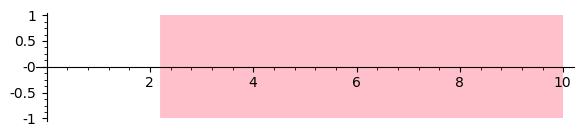

In [69]:
csigG.refined_signal(1).plot()

In [70]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, refine=1, **kwargs)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 148 flowpipes in 1.33514404296875e-05 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049219643 .. 1.5959882046270193]'), ('None', '[-0.18566626515688304 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404921964..1.5959882046270193]
S = [-0.18566626515688303..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9986373404921964..1.5959882046270193]', '[-0.18566626515688303..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c23ae60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c25d360>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c2729e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3becdd20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c2ac790>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3c2ac790>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-1.0..1.0]
contexts = ['[-1.0..1.0]']
statics  = []
symbolic_composition=False, tentative_unpreconditioning=True
M

statics  = []
symbolic_composition=False, tentative_unpreconditioning=True
Monitored initial signal 0.039275169372558594 sec
self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3c2ce150>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-1.0..0.0]
contexts = ['[-1.0..0.0]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] *

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c2ea900>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c2fb2c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c2670c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

C = [0.05..0.1]
S = [1.0998216199359216..1.5959882046270193]
S = [-0.03723395121934177..3.062331527832834]
contexts = ['[0.05..0.1]']
statics  = ['[1.0998216199359216..1.5959882046270193]', '[-0.03723395121934177..3.062331527832834]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c333a30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c341b10>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c2d9100>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c3cb7b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c3d7460>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c405ab0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c432bd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c4470b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c482370>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c4adb20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

Computed 7 flowpipes in 4.5299530029296875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c4d4340>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1446284143225267 .. 1.3866071886747283]'), ('None', '[-0.17842106206899919 .. 0.86738632434255348]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1446284143225267..1.3866071886747282]
S = [-0.1784210620689992..0.8673863243425535]
contexts = ['[0.05..0.1]']
statics  = ['[1.1446284143225267..1.3866071886747282]', '[-0.1784210620689992..0.8673863243425535]']
Computed 6 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c5020e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.10545468330383301 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) +

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c5401c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1235086486440903 .. 1.3145720835080875]'), ('None', '[-0.17084556752967379 .. 0.63933041165261773]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1235086486440904..1.3145720835080874]
S = [-0.17084556752967378..0.6393304116526177]
contexts = ['[0.05..0.1]']
statics  = ['[1.1235086486440904..1.3145720835080874]', '[-0.17084556752967378..0.6393304116526177]']
Computed 6 flowpipes in 4.0531158447265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c568a70>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 

S = [1.1167263937704153..1.298097637295676]
S = [-0.17123224088125288..0.5811139308410035]
contexts = ['[0.05..0.1]']
statics  = ['[1.1167263937704153..1.298097637295676]', '[-0.17123224088125288..0.5811139308410035]']
Computed 5 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c589100>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c43b000>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

Computed 3 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c5c85e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0272581999240841 .. 1.2275656499632238]'), ('None', '[-0.13637106290172352 .. 0.38670504969629050]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0272581999240842..1.2275656499632237]
S = [-0.13637106290172352..0.3867050496962905]
contexts = ['[0.05..0.1]']
statics  = ['[1.0272581999240842..1.2275656499632237]', '[-0.13637106290172352..0.3867050496962905]']
Computed 3 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c5e0420>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
r

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c5f01b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c605830>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c60f9a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c636580>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c55f800>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c660110>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.10906577110290527 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c693070>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c6bf820>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


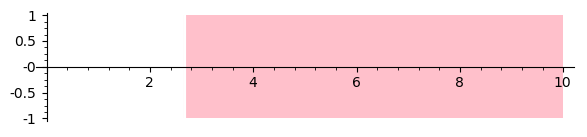

In [71]:
csigG.refined_signal(0).plot()

mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99938562762067362 .. 1.3844319636599350]'), ('None', '[-0.033154973963680647 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9993856276206736..1.384431963659935]
S = [-0.033154973963680646..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993856276206736..1.384431963659935]', '[-0.033154973963680646..5.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3992e0f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001])

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ac84c70>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3992e6c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3996d140>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd39919d40>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd39aa9e20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd39ac46b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd39a296f0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd39a55340>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1718228849969176 .. 1.3839234609231788]'), ('None', '[0.76280474128089281 .. 1.6523653716635463]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1718228849969177..1.3839234609231787]
S = [0.7628047412808928..1.6523653716635462]
contexts = ['[0.05..0.1]']
statics  = ['[1.1718228849969177..1.3839234609231787]', '[0.7628047412808928..1.6523653716635462]']
Computed 6 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd39a43310>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'((

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1737096714813417 .. 1.3724056456556773]'), ('None', '[0.53415618996835734 .. 1.3742029962869256]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1737096714813418..1.3724056456556772]
S = [0.5341561899683573..1.3742029962869255]
contexts = ['[0.05..0.1]']
statics  = ['[1.1737096714813418..1.3724056456556772]', '[0.5341561899683573..1.3742029962869255]']
Computed 6 flowpipes in 4.0531158447265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3acaf9f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3acb5b80>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

vars = [x, y]
C = [0.05..0.1]
S = [1.1622038680810118..1.3441655409583582]
S = [0.2663690167856115..1.0561235957142325]
contexts = ['[0.05..0.1]']
statics  = ['[1.1622038680810118..1.3441655409583582]', '[0.2663690167856115..1.0561235957142325]']
Computed 6 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd39991890>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.199

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3996ac60>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

Computed 5 flowpipes in 4.5299530029296875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd39ac1ae0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1416425337477564 .. 1.3060115740945486]'), ('None', '[0.12780603809832005 .. 0.78329358939080596]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1416425337477565..1.3060115740945486]
S = [0.12780603809832006..0.783293589390806]
contexts = ['[0.05..0.1]']
statics  = ['[1.1416425337477565..1.3060115740945486]', '[0.12780603809832006..0.783293589390806]']
Computed 3 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c713820>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd399648b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1186031940034144 .. 1.2811770538786032]'), ('None', '[0.050081282797690696 .. 0.66581150740553219]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1186031940034145..1.2811770538786031]
S = [0.050081282797690696..0.6658115074055322]
contexts = ['[0.05..0.1]']
statics  = ['[1.1186031940034145..1.2811770538786031]', '[0.050081282797690696..0.6658115074055322]']
Computed 3 flowpipes in 6.9141387939453125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c736090>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']


PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c746300>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1186031940034144 .. 1.2591555974914417]'), ('None', '[0.050081282797690696 .. 0.57018129062631429]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1186031940034145..1.2591555974914417]
S = [0.050081282797690696..0.5701812906263143]
contexts = ['[0.05..0.1]']
statics  = ['[1.1186031940034145..1.2591555974914417]', '[0.050081282797690696..0.5701812906263143]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ace9dd0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c75aac0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c76e710>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

S = [0.02298605187513808..0.47680187405281366]
contexts = ['[0.05..0.1]']
statics  = ['[1.1072005734516415..1.2339405895983464]', '[0.02298605187513808..0.47680187405281366]']
Computed 3 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c78f5e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.479999999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c799b00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c7b6d80>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

statics  = ['[1.0765442050960692..1.2049243939646297]', '[-0.007581325143053083..0.38223356222226695]']
Computed 3 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c7cad50>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c7d6e20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c7f5070>

Computed 3 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c807940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

Computed 3 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c8215b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c82e1e0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c845e40>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c8581e0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

Monitored initial signal 0.03550004959106445 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c870810>, (([-1.2000000000 , -1.1999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c883020>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c8a44d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0442831116974702 .. 1.2916958618325949]'), ('None', '[3.3464366359273305 .. 5.2541938776113924]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0442831116974702..1.2916958618325949]
S = [3.3464366359273305..5.254193877611392]
contexts = ['[0.05..0.1]']
statics  = ['[1.0442831116974702..1.2916958618325949]', '[3.3464366359273305..5.254193877611392]']
Computed 12 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c8c5af0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c906ee0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.00000

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.084034753690690563 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.084034753690690563 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1811068047288242 .. 1.4573507838997415]'), ('None', '[1.4391625357939632 .. 2.9953282401425261]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1811068047288242..1.4573507838997415]
S = [1.4391625357939632..2.995328240142526]
contexts = ['[0.05..0.1]']
statics  = ['[1.1811068047288242..1.4573507838997415]', '[1.4391625357939632..2.995328240142526]']
Computed 11 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c946850>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.100

roots = [[0.12409361630660480 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.12409361630660480 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.12409361630660480 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
P

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.19727467197062789 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.19727467197062789 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.19727467197062789 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2295296509857818 .. 1.4635112257827135]'), ('None', '[0.98753531656786808 .. 2.1072947769118385]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2295296509857818..1.4635112257827134]
S = [0.9875353165678681..2.1072947769118384]
contexts = ['[0.05..0.1]']
statics  = ['[1.2295296509857818..1.4635112257827134]', '[0.9875353165678681..2.1072947769118384]']
Computed 8 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.r

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c981ba0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c99dd00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2414058834719172 .. 1.4454278589883854]'), ('None', '[0.43816568806450351 .. 1.5032666065115921]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2414058834719173..1.4454278589883853]
S = [0.4381656880645035..1.503266606511592]
contexts = ['[0.05..0.1]']
statics  = ['[1.2414058834719173..1.4454278589883853]', '[0.4381656880645035..1.503266606511592]']
Computed 7 flowpipes in 5.4836273193359375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c9c0a00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c9e9ca0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ca0a1d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2330918972998086..1.4140259462386655]
S = [0.29677903039522635..1.1106193545125291]
contexts = ['[0.05..0.1]']
statics  = ['[1.2330918972998086..1.4140259462386655]', '[0.29677903039522635..1.1106193545125291]']
Computed 6 flowpipes in 4.76837158203125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ca31f10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ca4a400>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2087832795852548 .. 1.3677893471283192]'), ('None', '[0.14486281434862766 .. 0.82912115995917002]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2087832795852549..1.3677893471283191]
S = [0.14486281434862766..0.82912115995917]
contexts = ['[0.05..0.1]']
statics  = ['[1.2087832795852549..1.3677893471283191]', '[0.14486281434862766..0.82912115995917]']
Computed 6 flowpipes in 5.245208740234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ca802c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0800

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ca8c680>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

Computed 3 flowpipes in 5.245208740234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3caa64f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cabb0e0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cacabf0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cae28b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

0 at 0.201000000000001
Monitored initial signal 0.06664514541625977 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cb02cf0>, (([

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1290093452527545 .. 1.2687191899418627]'), ('None', '[-0.015639665278453605 .. 0.44277328213455547]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1290093452527545..1.2687191899418626]
S = [-0.015639665278453604..0.44277328213455547]
contexts = ['[0.05..0.1]']
statics  = ['[1.1290093452527545..1.2687191899418626]', '[-0.015639665278453604..0.44277328213455547]']
Computed 3 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cb10bf0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cb226c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cb30d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cb4c6b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cb5d0a0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0884296536216671 .. 1.2060956797492244]'), ('None', '[-0.033683113406315066 .. 0.29896994736271982]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.088429653621667..1.2060956797492244]
S = [-0.033683113406315066..0.2989699473627198]
contexts = ['[0.05..0.1]']
statics  = ['[1.088429653621667..1.2060956797492244]', '[-0.033683113406315066..0.2989699473627198]']
Computed 3 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cb86ae0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']


var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cbc53e0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cbde540>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cc04ba0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = []
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.000000000

0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2013137621991982 .. 1.4422827223117345]'), ('None', '[1.6896134737083121 .. 3.3768457476973675]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2013137621991983..1.4422827223117345]
S = [1.6896134737083122..3.3768457476973675]
contexts = ['[0.05..0.1]']
statics  = ['[1.2013137621991983..1.4422827223117345]', '[1.6896134737083122..3.3768457476973675]']
Computed 11 flowpipes in 1.9311904907226562e-05 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cc65e90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local

seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2351206322324559 .. 1.4776401426776942]'), ('None', '[0.22708151855146882 .. 2.0546765815450208]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.235120632232456..1.4776401426776942]
S = [0.22708151855146883..2.0546765815450208]
contexts = ['[0.05..0.1]']
statics  = ['[1.235120632232456..1.4776401426776942]', '[0.22708151855146883..2.0546765815450208]']
Computed 9 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ccb2650>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unprecondit

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ccea460>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.17329120635986328 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) +

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cd4d950>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cd80bf0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cdaabb0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cde87b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ce03830>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ce46870>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

S = [1.1353369054912354..1.2765208800798666]
S = [-0.04473799929321107..0.42482157150466154]
contexts = ['[0.05..0.1]']
statics  = ['[1.1353369054912354..1.2765208800798666]', '[-0.04473799929321107..0.42482157150466154]']
Computed 3 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ce61020>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.1265087127685547 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2)

Computed 3 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cea9f50>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.10341477394104004 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cedd650>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cf1b670>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.12954998016357422 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flow

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3cf65410>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3cfe7a30>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.3313807813507987 .. 1.5675365147506748]'), ('None', '[0.47555570753449610 .. 2.2228738395018240]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.3313807813507987..1.5675365147506748]
S = [0.4755557075344961..2.222873839501824]
contexts = ['[0.05..0.1]']
statics  = ['[1.3313807813507987..1.5675365147506748]', '[0.4755557075344961..2.222873839501824]']
Computed 11 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d0111d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d021360>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

S = [1.2951397764349153..1.5340360233448205]
S = [0.13248079967322257..1.2274665884960234]
contexts = ['[0.05..0.1]']
statics  = ['[1.2951397764349153..1.5340360233448205]', '[0.13248079967322257..1.2274665884960234]']
Computed 8 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d09db50>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.1552896499633789 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2)

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d100560>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.13826584815979004 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d1583d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d18f930>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d1c0d10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.11510038375854492 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d207e80>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d218d30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d24d130>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d28b400>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

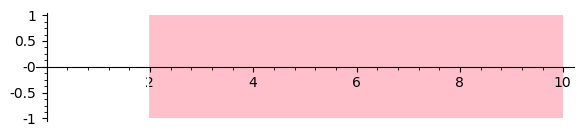

In [72]:
csigG.refined_signal(1).plot()

In [73]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, refine=2, **kwargs)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 148 flowpipes in 5.7220458984375e-06 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049219643 .. 1.5959882046270193]'), ('None', '[-0.18566626515688304 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404921964..1.5959882046270193]
S = [-0.18566626515688303..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9986373404921964..1.5959882046270193]', '[-0.18566626515688303..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d789c80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d799580>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d7ae070>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d796fe0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

vars = [x, y]
C = [-1.0..0.0]
contexts = ['[-1.0..0.0]']
statics  = []
symbolic_composition=False, tentative_unpreconditioning=True
self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3d7afb10>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-1.0..-0.5]
contexts = ['[-1.0..-0.5]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d7cd2d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d7ebca0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d7f6630>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3d817090>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-0.5..-0.0]
contexts = ['[-0.5..-0.0]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

C = [-1.0..-0.5]
contexts = ['[-1.0..-0.5]']
statics  = []
symbolic_composition=False, tentative_unpreconditioning=True
self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3d8326b0>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-0.5..-0.0]
contexts = ['[-0.5..-0.0]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^

symbolic_composition=False, tentative_unpreconditioning=True
Monitored initial signal 0.03649783134460449 sec
self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3d7c3210>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-1.0..0.0]
contexts = ['[-1.0..0.0]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Pol

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d7d0140>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d7f2df0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d86e3c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d870590>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d884b10>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8a6af0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8a99c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8b1b50>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8b2690>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8d8f00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8e6080>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8ff520>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1415581562770693 .. 1.5836900385689397]'), ('None', '[0.29592634805114292 .. 2.1887311089983542]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1415581562770694..1.5836900385689396]
S = [0.29592634805114293..2.188731108998354]
contexts = ['[0.05..0.1]']
statics  = ['[1.1415581562770694..1.5836900385689396]', '[0.29592634805114293..2.188731108998354]']
Computed 12 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d8ffd90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d8ffd90>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.4670543670654297 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d966bb0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d994f20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d9c5810>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d9d1f70>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d9eb030>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3da156b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3da240d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3da39820>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) +

Computed 7 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3da70df0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3da858c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3d9b7910>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dab3fe0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.137595083205158..1.3729726249871868]
S = [-0.1855356410567863..0.8229807900123176]
contexts = ['[0.05..0.1]']
statics  = ['[1.137595083205158..1.3729726249871868]', '[-0.1855356410567863..0.8229807900123176]']
Computed 6 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dac0df0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dac87d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dada990>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3db08fc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3db19c10>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1096886211462764 .. 1.2980976372956761]'), ('None', '[-0.17123224088125289 .. 0.58111393084100349]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1096886211462764..1.298097637295676]
S = [-0.17123224088125288..0.5811139308410035]
contexts = ['[0.05..0.1]']
statics  = ['[1.1096886211462764..1.298097637295676]', '[-0.17123224088125288..0.5811139308410035]']
Computed 5 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3db31a10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3db74f40>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3db848f0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3db8f360>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.000000000000000

0 at 0.201000000000001
Monitored initial signal 0.0823976993560791 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dba64f0>, (([-

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.00000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dbc4070>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.10553836822509766 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dbf3f80>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dc0e470>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dc1f2f0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dc2c990>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

statics  = ['[1.0485393390418603..1.1756029818918]', '[-0.11928239535102239..0.2812908714491727]']
Computed 3 flowpipes in 2.86102294921875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dc43990>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.10000

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dc678e0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.06314516067504883 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) +

seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dc91eb0>, (([-1.2

Computed 2 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dcaf520>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


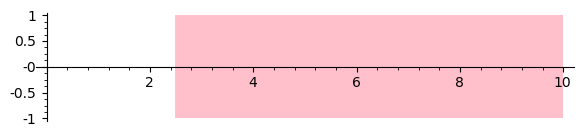

In [74]:
csigG.refined_signal(0).plot()

mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99938562762067362 .. 1.3844319636599350]'), ('None', '[-0.033154973963680647 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9993856276206736..1.384431963659935]
S = [-0.033154973963680646..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993856276206736..1.384431963659935]', '[-0.033154973963680646..5.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dca04a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001])

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dca04a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c0d9be0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c1b4870>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c0c9d40>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c1cd480>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

Computed 11 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c0a5000>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dca5280>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1247675834524104 .. 1.3838339535629057]'), ('None', '[1.0290430696666330 .. 2.6743759040339459]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1247675834524105..1.3838339535629056]
S = [1.029043069666633..2.674375904033946]
contexts = ['[0.05..0.1]']
statics  = ['[1.1247675834524105..1.3838339535629056]', '[1.029043069666633..2.674375904033946]']
Computed 9 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c0e3a30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c0d30b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c12ad90>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c1db790>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.14157733749347015 .. 0.14503125000000006], 
 [0.16302681140902719 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.11537766456604004 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c212a70>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.058311664074716919 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.058311664074716919 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1684660895187148 .. 1.3844319636599350]'), ('None', '[0.89631149975352597 .. 1.8063733312780273]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.168466089518715..1.384431963659935]
S = [0.896311499753526..1.8063733312780272]
contexts = ['[0.05..0.1]']
statics  = ['[1.168466089518715..1.384431963659935]', '[0.896311499753526..1.8063733312780272]']
Computed 6 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c020ab0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.800

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c020ab0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.085003165095785024 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.085003165095785024 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.085003165095785024 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

roots = [[0.016710220426548502 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.016710220426548502 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.016710220426548502 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c05c240>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c05c240>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c0fb870>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c205bc0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c0bb500>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c2274c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c2274c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c129720>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1560184108399218 .. 1.3262589674699302]'), ('None', '[0.22005339857037767 .. 0.90667443180896468]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1560184108399219..1.32625896746993]
S = [0.22005339857037767..0.9066744318089647]
contexts = ['[0.05..0.1]']
statics  = ['[1.1560184108399219..1.32625896746993]', '[0.22005339857037767..0.9066744318089647]']
Computed 5 flowpipes in 3.337860107421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c06d810>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c081440>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c08e190>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.000000000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3bfa3170>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.1363669565358491 .. 1.2811770538786032]'), ('None', '[0.10646964644417789 .. 0.66581150740553219]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1363669565358492..1.2811770538786031]
S = [0.10646964644417789..0.6658115074055322]
contexts = ['[0.05..0.1]']
statics  = ['[1.1363669565358492..1.2811770538786031]', '[0.10646964644417789..0.6658115074055322]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bfbdb20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) +

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3bfede10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dcc9310>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0988492329643919 .. 1.2254416988654802]'), ('None', '[0.010294651844762969 .. 0.44820451850922283]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.098849232964392..1.2254416988654802]
S = [0.01029465184476297..0.4482045185092228]
contexts = ['[0.05..0.1]']
statics  = ['[1.098849232964392..1.2254416988654802]', '[0.01029465184476297..0.4482045185092228]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dce2b20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3c064110>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd04320>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.00000

Computed 3 flowpipes in 6.4373016357421875e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dd26210>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd27a60>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd2e290>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd3d090>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dd61ef0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd6b2a0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd79fe0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dd87fd0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.000000000000000

Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dd97b80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.13125000000000001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.13125000000000001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.13125000000000001]]
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ddb6c00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ddb4490>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

other = <flowstar.reachability.Reach object at 0x55fd3dd68240>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [0.5..1.0]
contexts = ['[0.5..1.0]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.00000000

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ddf07c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
other = <flowstar.reachability.Reach object at 0x55fd3ddf07c0>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [-1.0..1.0]
contexts = ['[-1.0..1.0]']
statics  = []
symbolic_composition=False, tentative_unpreconditioning=True
M

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3de09b00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3de2c590>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3de5f460>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3de90980>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.084034753690690563 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.084034753690690563 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.084034753690690563 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3ded3100>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.13036576862431156 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.13036576862431

contexts = ['[0.05..0.1]']
statics  = ['[1.2295296509857818..1.4635112257827134]', '[0.9875353165678681..2.1072947769118384]']
Computed 8 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3defef60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.40

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3df0b4a0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3df34c80>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3df3fc20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3df50fa0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3df64960>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3df7d770>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2178917504345947 .. 1.4257569267508166]'), ('None', '[0.18857350363983615 .. 1.2209470648598316]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2178917504345947..1.4257569267508166]
S = [0.18857350363983616..1.2209470648598315]
contexts = ['[0.05..0.1]']
statics  = ['[1.2178917504345947..1.4257569267508166]', '[0.18857350363983616..1.2209470648598315]']
Computed 6 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dfa0f20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dfadb20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3dfd5db0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e0197f0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e02ccd0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e042e50>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.0920870304107666 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e07c230>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e088380>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e0892e0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e0a6560>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e0c4b20>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e0cde90>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e0f1170>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y)) symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.000000000000000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e100bb0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.00000

ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.1013362928122272..1.2236135280247051]
S = [-0.025292878060639484..0.33033831592318297]
contexts = ['[0.05..0.1]']
statics  = ['[1.1013362928122272..1.2236135280247051]', '[-0.025292878060639484..0.33033831592318297]']
Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e140250>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'loc

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.06946587562561035 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e17a2b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) +

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0667468180781911 .. 1.1727464606566698]'), ('None', '[-0.043293816265558720 .. 0.23967521860872485]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.0667468180781912..1.1727464606566698]
S = [-0.04329381626555872..0.23967521860872484]
contexts = ['[0.05..0.1]']
statics  = ['[1.0667468180781912..1.1727464606566698]', '[-0.04329381626555872..0.23967521860872484]']
Computed 3 flowpipes in 1.8596649169921875e-05 sec
PolyObserver(x^2 + y^2 - 2*x + 0

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e1ad8f0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e1bfe50>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e1c81f0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e17d8b0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.11861611433492658 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.11861611433492658 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.11861611433492658 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.23248076438903809 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e250480>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = []
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2489485812164071 .. 1.4718049985437692]'), ('None', '[1.1880508713144171 .. 2.3401744863693362]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2489485812164072..1.4718049985437691]
S = [1.1880508713144171..2.340174486369336]
contexts = ['[0.05..0.1]']
statics  = ['[1.2489485812164072..1.4718049985437691]', '[1.1880508713144171..2.340174486369336]']
Computed 8 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e290440>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e2bf430>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.095660109638720625 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.095660109638720625 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e2f5190>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e3012c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e31ecd0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e330c30>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e35f800>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e39f870>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e3b7580>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e3dd420>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.1294851303100586 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2)

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e44f590>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.19999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e44f590>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e461a70>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

statics  = ['[1.1184221591541552..1.289979262566638]', '[-0.057860438734052846..0.454720701306254]']
Computed 3 flowpipes in 5.7220458984375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e47df10>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e491640>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e494580>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.00000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e4d9440>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.199

roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e522ff0>

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e541200>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e56f980>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e588ca0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

other = <flowstar.reachability.Reach object at 0x55fd3e599c00>
other.system_vars = [x, y]
_handle_initials called!
vars = [x, y]
C = [0.0..0.5]
contexts = ['[0.0..0.5]']
statics  = []
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.00000000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e5ba520>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = []
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.000000000

statics  = ['[1.2976305924631304..1.5491325409058911]', '[1.5724576020710115..2.9999751248291773]']
Computed 11 flowpipes in 3.5762786865234375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e6635b0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e686350>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

roots = [[0.095743926530777137 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.095743926530777137 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.095743926530777137 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.11480021476745605 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * 

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e7126a0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

Computed 8 flowpipes in 4.291534423828125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e723730>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e754d50>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.39999999

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e780410>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.2697266760616141 .. 1.4606651270934253]'), ('None', '[0.052505986360283599 .. 0.78581638973393154]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [1.2697266760616142..1.4606651270934252]
S = [0.0525059863602836..0.7858163897339315]
contexts = ['[0.05..0.1]']
statics  = ['[1.2697266760616142..1.4606651270934252]', '[0.0525059863602836..0.7858163897339315]']
Computed 6 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e718b30>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000

roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^

0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e816020>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.100000

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e844f30>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e870ba0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e890620>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) 

roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
Poly

self.reach.vars = [x, y]
symbolic_composition=False, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.0000000000000000 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
Monitored initial signal 0.10403728485107422 sec
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2

roots = [[0.0000000000000000 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000

var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd3e910a20>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 

Computed 3 flowpipes in 3.814697265625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3e940c00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799

roots = [[0.0000000000000000 .. 0.13125000000000001], [0.16914783373277159 .. 0.20199999999900001]]
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.13125000000000001], 
 [0.16914783373277159 .. 0.20199999999900001]]
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = [[0.0000000000000000 .. 0.13125000000000001], 
 [0.16914783373277159 .. 0.20199999999900001]]
0 at 0.201000000000001
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y

roots = []
domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
seg_domain = [0.0000000000000000 .. 0.20100000000000004]
roots = []
self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.000000000

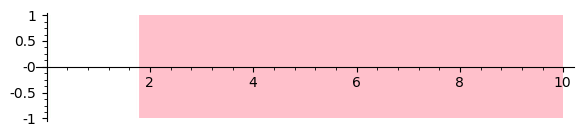

In [75]:
csigG.refined_signal(1).plot()

## Differential Context

In [ ]:
{x: RIF(6,7)} % G(RIF(0,0.2), P)

In [ ]:
# Use symbolic remainders for context jump 
kwargs['integrationScheme'] = 7

In [ ]:
kwargs['verbosity'] = 10

In [ ]:
kwargs['symbolic_composition'] = True

In [ ]:
sig = ({x: RIF(6)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(6, 6.1)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(10, 10.05)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
{x: 1, y: 2}

In [ ]:
kxs = [[('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))], [('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))]]

In [ ]:
sorted(kxs)

In [ ]:
sorted(kxs,
       key=lambda xs: [(k, x.endpoints()) for k, x in xs])